# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

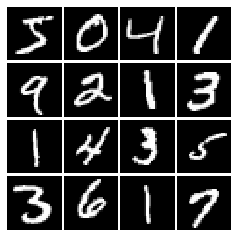

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    x = tf.nn.leaky_relu(x,alpha)
    return x

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.07, G:0.6873
Instructions for updating:
Use tf.identity instead.


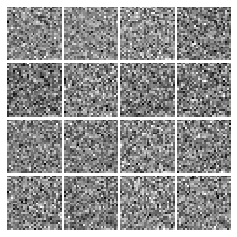

Epoch: 0, Iter: 20, D: 0.6212, G:0.868


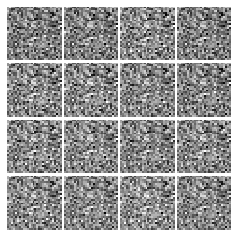

Epoch: 0, Iter: 40, D: 0.4406, G:1.152


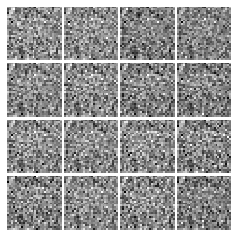

Epoch: 0, Iter: 60, D: 0.1357, G:2.739


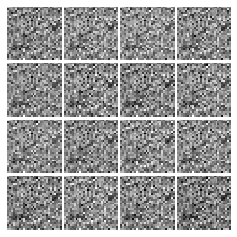

Epoch: 0, Iter: 80, D: 5.223, G:0.1484


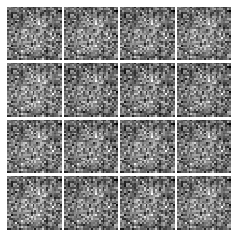

Epoch: 0, Iter: 100, D: 1.105, G:0.8176


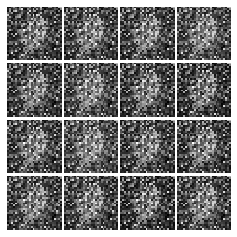

Epoch: 0, Iter: 120, D: 1.583, G:1.122


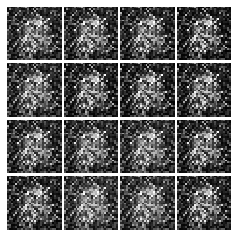

Epoch: 0, Iter: 140, D: 1.264, G:0.9324


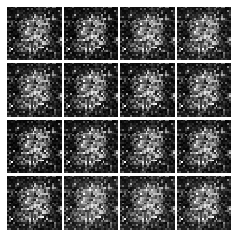

Epoch: 0, Iter: 160, D: 1.325, G:1.121


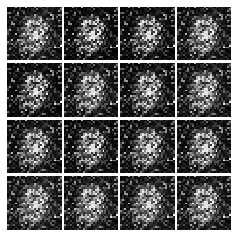

Epoch: 0, Iter: 180, D: 0.704, G:1.985


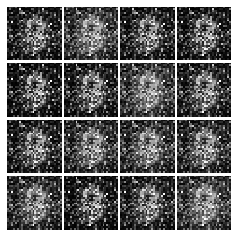

Epoch: 0, Iter: 200, D: 1.066, G:0.855


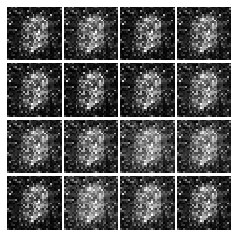

Epoch: 0, Iter: 220, D: 0.9892, G:1.242


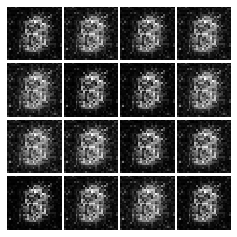

Epoch: 0, Iter: 240, D: 1.387, G:1.303


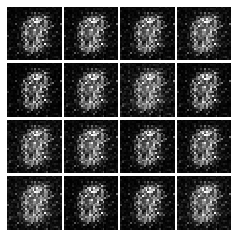

Epoch: 0, Iter: 260, D: 1.139, G:1.339


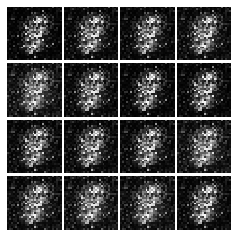

Epoch: 0, Iter: 280, D: 1.189, G:1.207


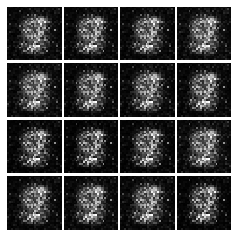

Epoch: 0, Iter: 300, D: 0.9348, G:1.521


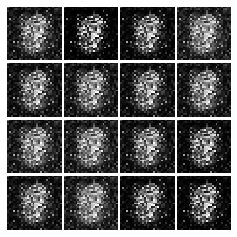

Epoch: 0, Iter: 320, D: 1.393, G:0.9688


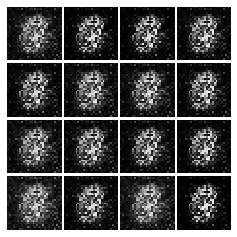

Epoch: 0, Iter: 340, D: 1.245, G:1.222


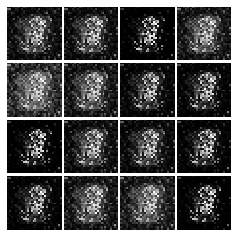

Epoch: 0, Iter: 360, D: 0.7614, G:5.379


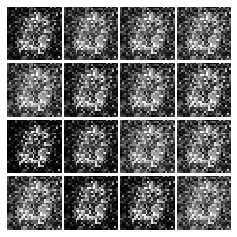

Epoch: 0, Iter: 380, D: 1.103, G:1.801


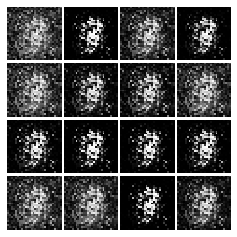

Epoch: 0, Iter: 400, D: 0.9472, G:1.438


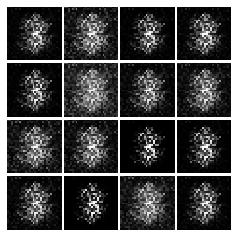

Epoch: 0, Iter: 420, D: 1.129, G:1.748


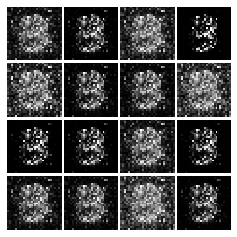

Epoch: 0, Iter: 440, D: 1.17, G:1.658


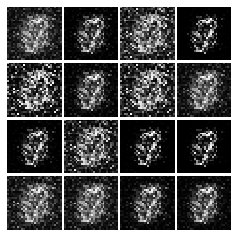

Epoch: 0, Iter: 460, D: 1.235, G:1.389


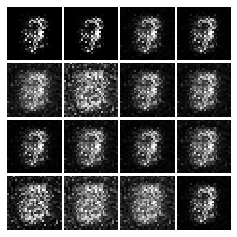

Epoch: 1, Iter: 480, D: 1.122, G:0.8652


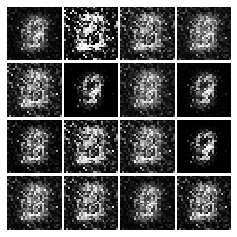

Epoch: 1, Iter: 500, D: 1.138, G:2.165


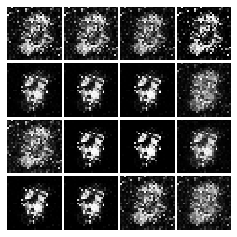

Epoch: 1, Iter: 520, D: 1.02, G:1.462


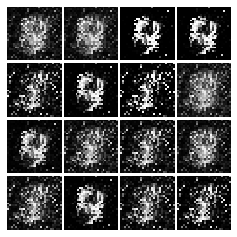

Epoch: 1, Iter: 540, D: 1.285, G:1.037


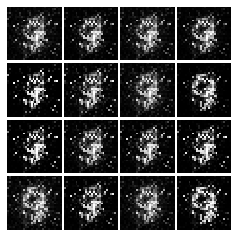

Epoch: 1, Iter: 560, D: 0.9733, G:1.73


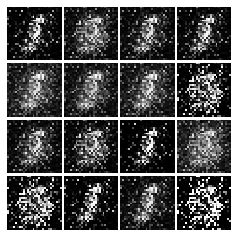

Epoch: 1, Iter: 580, D: 1.384, G:1.282


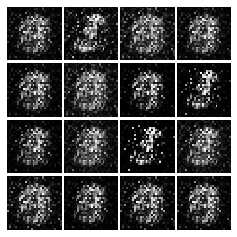

Epoch: 1, Iter: 600, D: 1.209, G:1.153


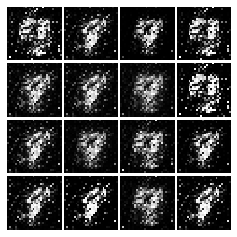

Epoch: 1, Iter: 620, D: 1.23, G:0.9496


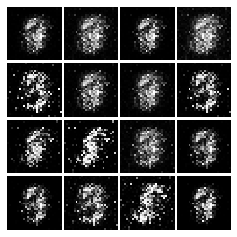

Epoch: 1, Iter: 640, D: 1.334, G:1.325


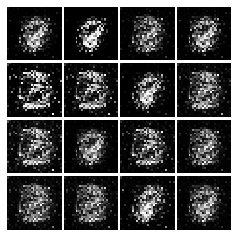

Epoch: 1, Iter: 660, D: 1.225, G:1.249


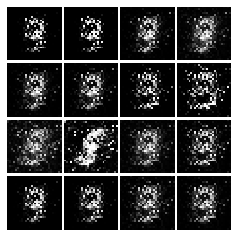

Epoch: 1, Iter: 680, D: 1.621, G:0.6157


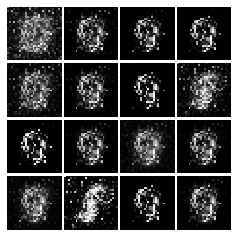

Epoch: 1, Iter: 700, D: 1.561, G:0.6524


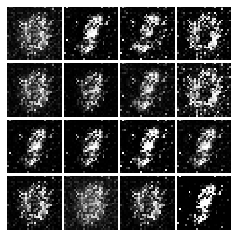

Epoch: 1, Iter: 720, D: 1.217, G:1.247


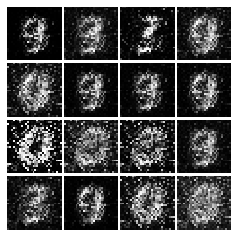

Epoch: 1, Iter: 740, D: 1.306, G:1.35


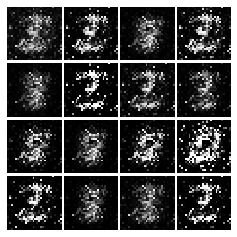

Epoch: 1, Iter: 760, D: 1.15, G:1.258


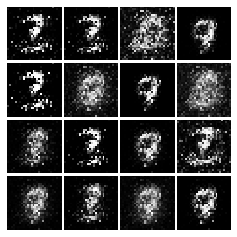

Epoch: 1, Iter: 780, D: 3.452, G:0.6703


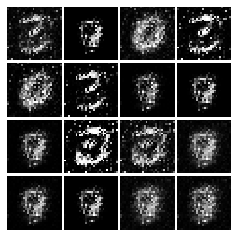

Epoch: 1, Iter: 800, D: 1.108, G:0.7471


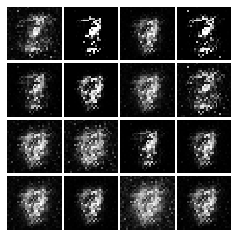

Epoch: 1, Iter: 820, D: 1.26, G:2.188


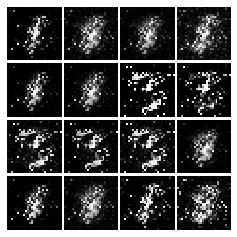

Epoch: 1, Iter: 840, D: 1.361, G:1.443


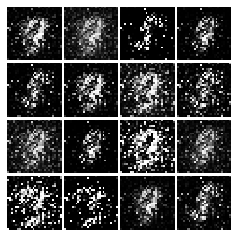

Epoch: 1, Iter: 860, D: 1.429, G:1.281


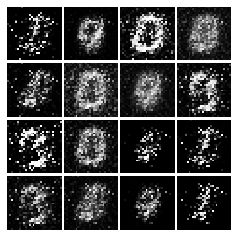

Epoch: 1, Iter: 880, D: 1.177, G:1.112


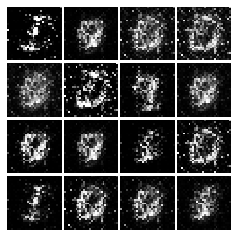

Epoch: 1, Iter: 900, D: 1.191, G:1.38


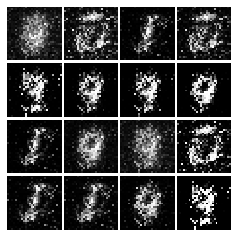

Epoch: 1, Iter: 920, D: 1.183, G:1.157


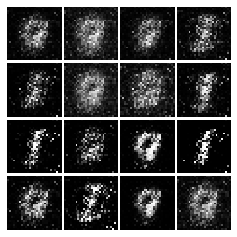

Epoch: 2, Iter: 940, D: 1.387, G:1.446


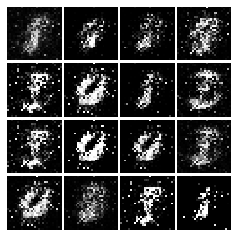

Epoch: 2, Iter: 960, D: 0.9801, G:1.899


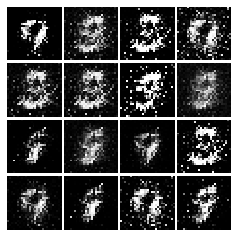

Epoch: 2, Iter: 980, D: 1.269, G:1.454


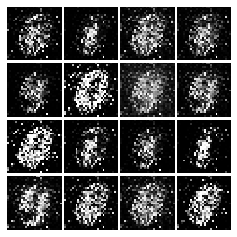

Epoch: 2, Iter: 1000, D: 0.9492, G:1.181


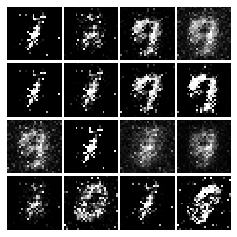

Epoch: 2, Iter: 1020, D: 1.131, G:0.8713


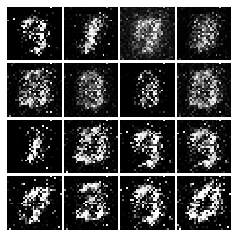

Epoch: 2, Iter: 1040, D: 0.9967, G:1.457


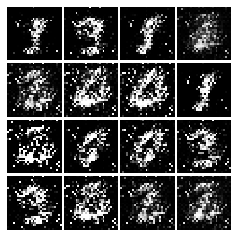

Epoch: 2, Iter: 1060, D: 1.511, G:1.04


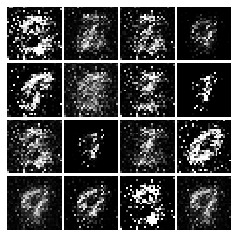

Epoch: 2, Iter: 1080, D: 1.08, G:1.19


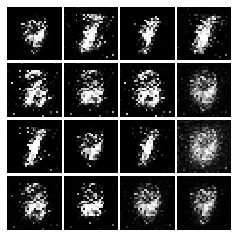

Epoch: 2, Iter: 1100, D: 1.146, G:1.079


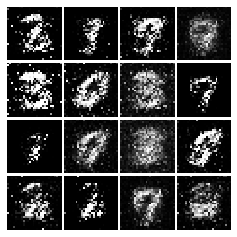

Epoch: 2, Iter: 1120, D: 1.838, G:0.6289


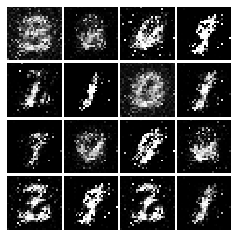

Epoch: 2, Iter: 1140, D: 1.179, G:1.041


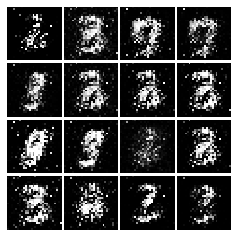

Epoch: 2, Iter: 1160, D: 1.048, G:1.17


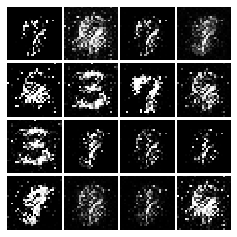

Epoch: 2, Iter: 1180, D: 1.11, G:1.203


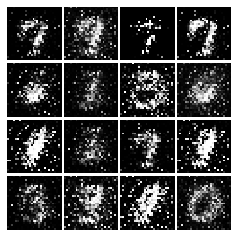

Epoch: 2, Iter: 1200, D: 1.569, G:1.01


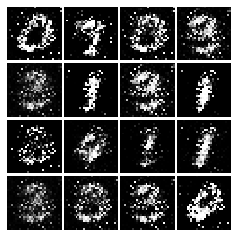

Epoch: 2, Iter: 1220, D: 1.383, G:1.191


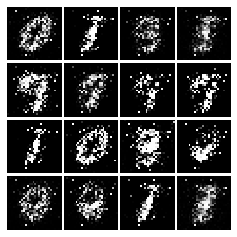

Epoch: 2, Iter: 1240, D: 1.116, G:1.184


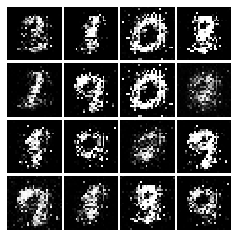

Epoch: 2, Iter: 1260, D: 1.13, G:1.223


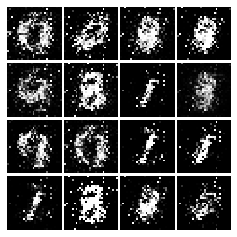

Epoch: 2, Iter: 1280, D: 1.079, G:1.774


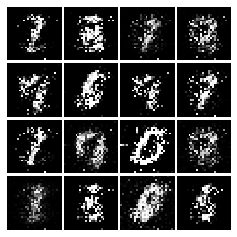

Epoch: 2, Iter: 1300, D: 1.216, G:1.176


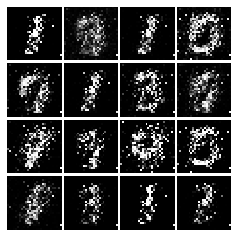

Epoch: 2, Iter: 1320, D: 1.566, G:0.9567


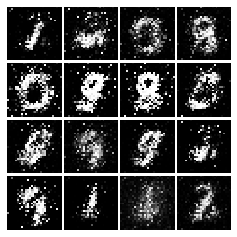

Epoch: 2, Iter: 1340, D: 1.243, G:1.123


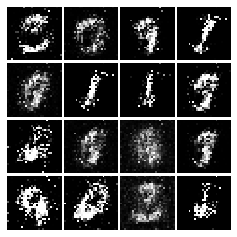

Epoch: 2, Iter: 1360, D: 1.413, G:0.8858


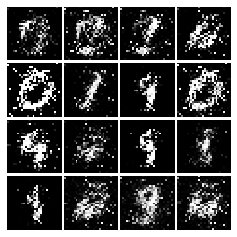

Epoch: 2, Iter: 1380, D: 1.304, G:0.9393


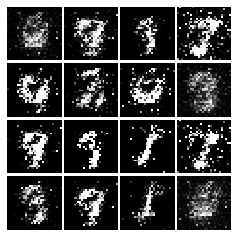

Epoch: 2, Iter: 1400, D: 1.406, G:0.4646


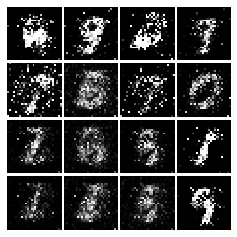

Epoch: 3, Iter: 1420, D: 1.365, G:0.9197


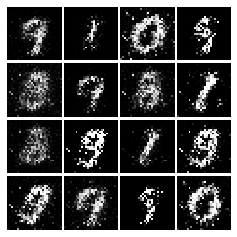

Epoch: 3, Iter: 1440, D: 1.3, G:1.252


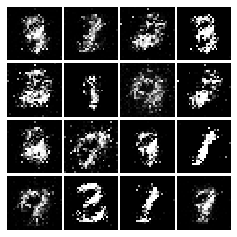

Epoch: 3, Iter: 1460, D: 1.163, G:1.266


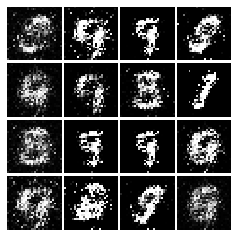

Epoch: 3, Iter: 1480, D: 1.326, G:0.7069


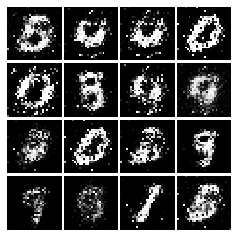

Epoch: 3, Iter: 1500, D: 1.275, G:0.813


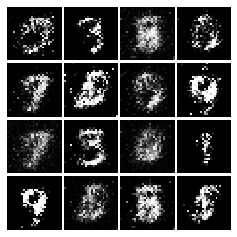

Epoch: 3, Iter: 1520, D: 1.4, G:0.7277


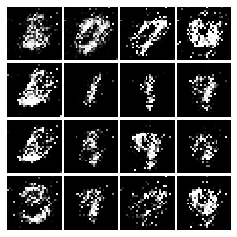

Epoch: 3, Iter: 1540, D: 1.244, G:0.7359


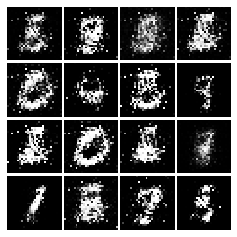

Epoch: 3, Iter: 1560, D: 1.311, G:0.8319


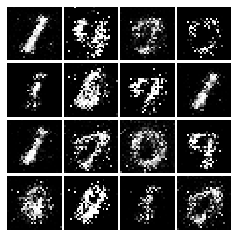

Epoch: 3, Iter: 1580, D: 1.201, G:0.9842


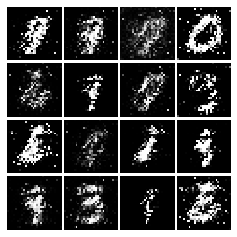

Epoch: 3, Iter: 1600, D: 1.281, G:0.9822


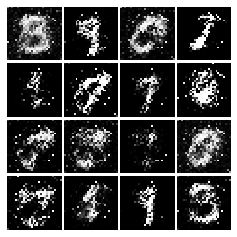

Epoch: 3, Iter: 1620, D: 1.27, G:1.312


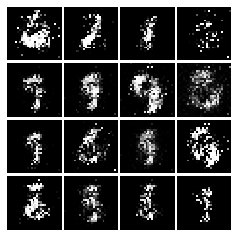

Epoch: 3, Iter: 1640, D: 1.3, G:1.19


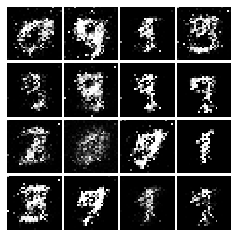

Epoch: 3, Iter: 1660, D: 1.294, G:1.393


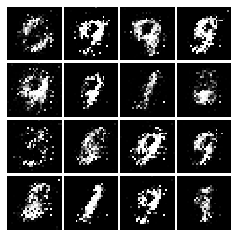

Epoch: 3, Iter: 1680, D: 1.122, G:2.153


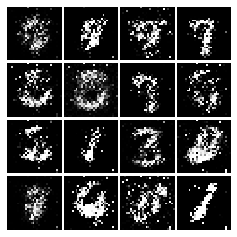

Epoch: 3, Iter: 1700, D: 1.21, G:1.338


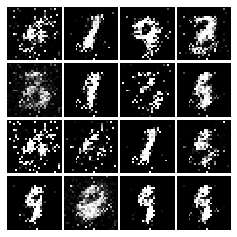

Epoch: 3, Iter: 1720, D: 1.325, G:0.9045


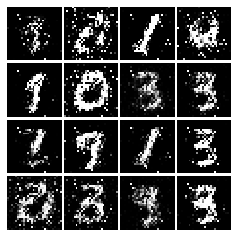

Epoch: 3, Iter: 1740, D: 1.266, G:1.009


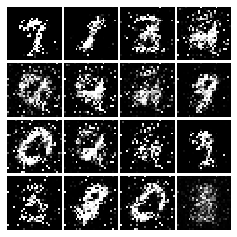

Epoch: 3, Iter: 1760, D: 1.675, G:0.6054


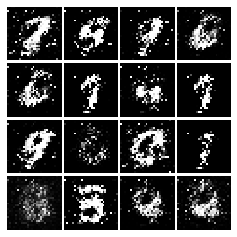

Epoch: 3, Iter: 1780, D: 1.256, G:0.9474


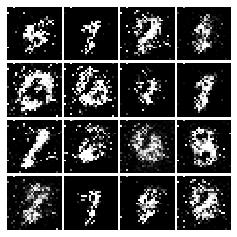

Epoch: 3, Iter: 1800, D: 1.186, G:1.302


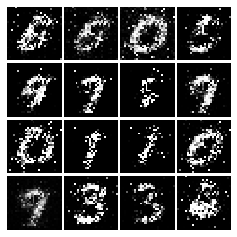

Epoch: 3, Iter: 1820, D: 1.351, G:1.014


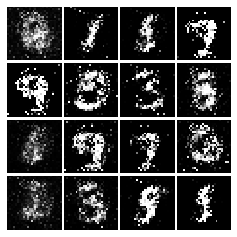

Epoch: 3, Iter: 1840, D: 1.252, G:0.9413


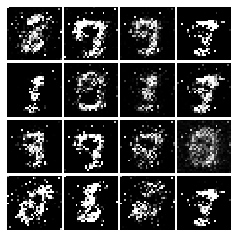

Epoch: 3, Iter: 1860, D: 1.257, G:1.005


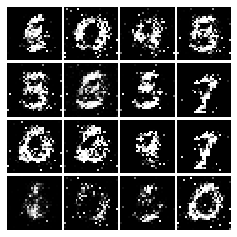

Epoch: 4, Iter: 1880, D: 1.299, G:0.9632


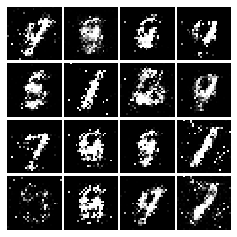

Epoch: 4, Iter: 1900, D: 1.273, G:0.8777


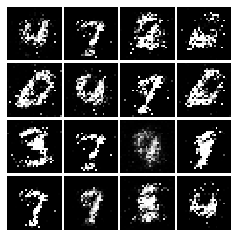

Epoch: 4, Iter: 1920, D: 1.203, G:1.006


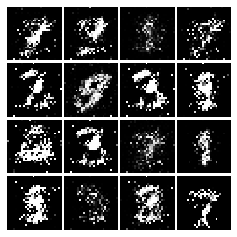

Epoch: 4, Iter: 1940, D: 1.28, G:1.37


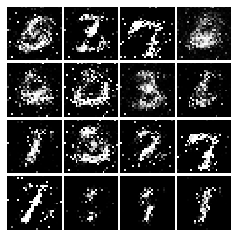

Epoch: 4, Iter: 1960, D: 1.15, G:1.488


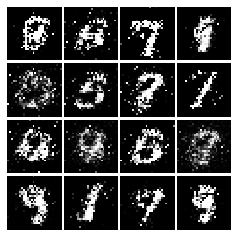

Epoch: 4, Iter: 1980, D: 1.285, G:1.178


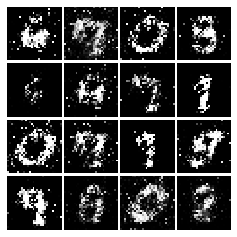

Epoch: 4, Iter: 2000, D: 1.368, G:0.9648


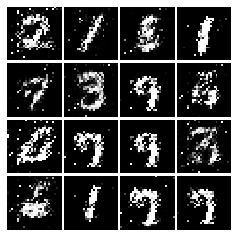

Epoch: 4, Iter: 2020, D: 1.318, G:0.8183


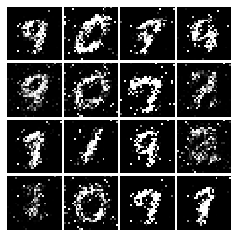

Epoch: 4, Iter: 2040, D: 1.319, G:0.8702


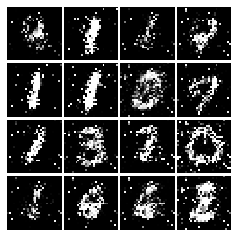

Epoch: 4, Iter: 2060, D: 1.255, G:1.251


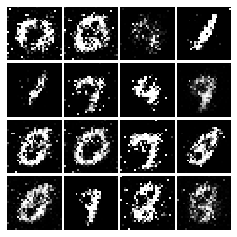

Epoch: 4, Iter: 2080, D: 1.192, G:0.9919


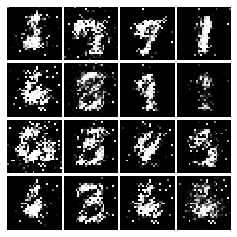

Epoch: 4, Iter: 2100, D: 1.226, G:1.086


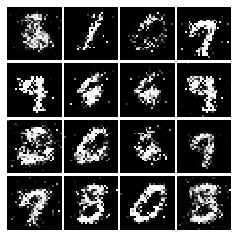

Epoch: 4, Iter: 2120, D: 1.346, G:0.8298


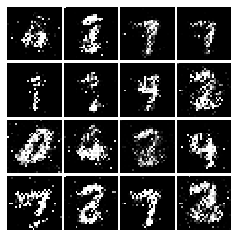

Epoch: 4, Iter: 2140, D: 1.308, G:0.908


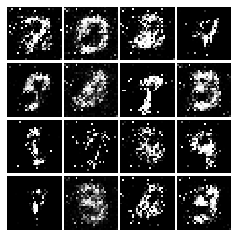

Epoch: 4, Iter: 2160, D: 1.302, G:0.8555


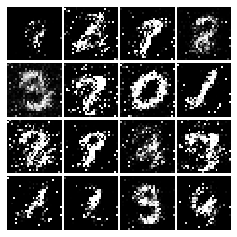

Epoch: 4, Iter: 2180, D: 1.361, G:0.8344


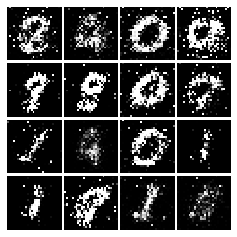

Epoch: 4, Iter: 2200, D: 1.168, G:1.081


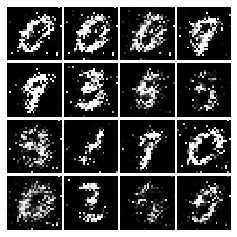

Epoch: 4, Iter: 2220, D: 1.237, G:0.9811


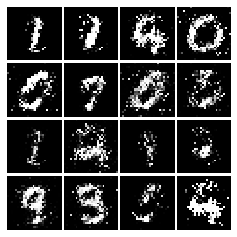

Epoch: 4, Iter: 2240, D: 1.263, G:0.766


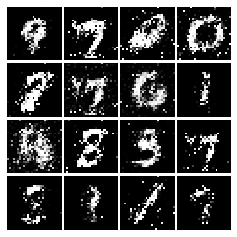

Epoch: 4, Iter: 2260, D: 1.301, G:0.6225


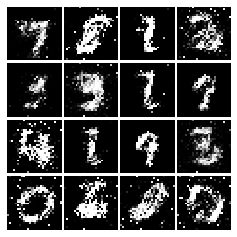

Epoch: 4, Iter: 2280, D: 1.236, G:0.9005


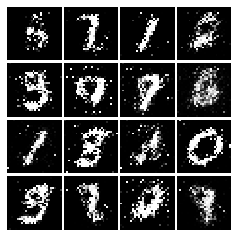

Epoch: 4, Iter: 2300, D: 1.193, G:1.025


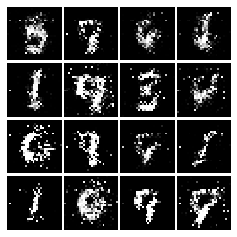

Epoch: 4, Iter: 2320, D: 1.215, G:0.8892


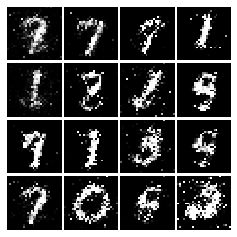

Epoch: 4, Iter: 2340, D: 1.144, G:0.9324


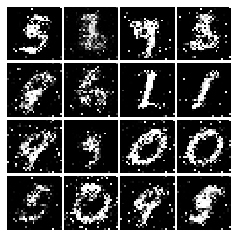

Epoch: 5, Iter: 2360, D: 1.167, G:0.9313


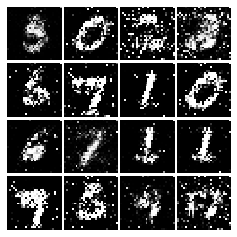

Epoch: 5, Iter: 2380, D: 1.247, G:0.8533


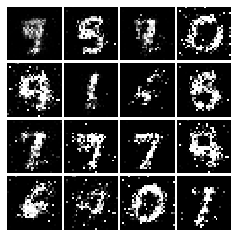

Epoch: 5, Iter: 2400, D: 1.465, G:0.8809


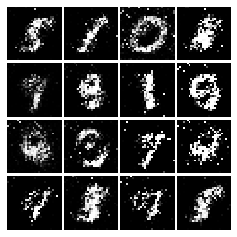

Epoch: 5, Iter: 2420, D: 1.188, G:0.9611


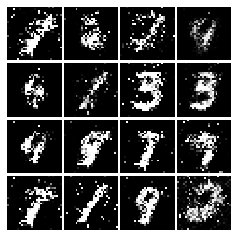

Epoch: 5, Iter: 2440, D: 1.297, G:0.9488


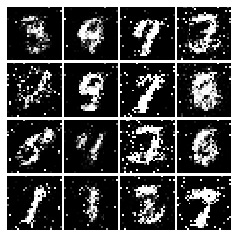

Epoch: 5, Iter: 2460, D: 1.141, G:1.207


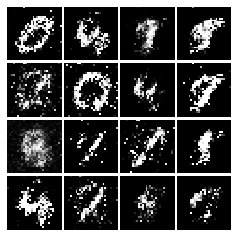

Epoch: 5, Iter: 2480, D: 1.281, G:0.9358


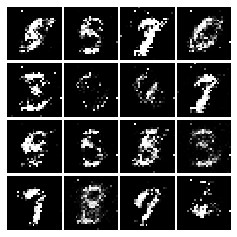

Epoch: 5, Iter: 2500, D: 1.222, G:1.02


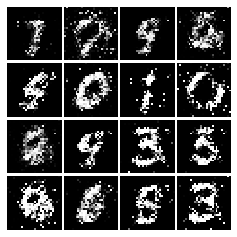

Epoch: 5, Iter: 2520, D: 1.368, G:0.8246


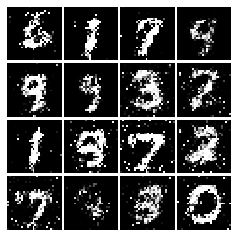

Epoch: 5, Iter: 2540, D: 1.24, G:0.9212


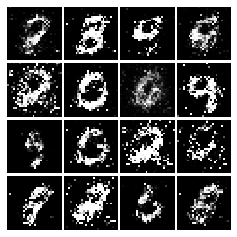

Epoch: 5, Iter: 2560, D: 1.313, G:0.8086


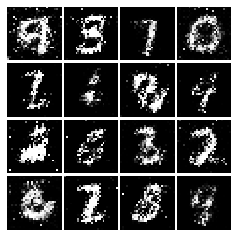

Epoch: 5, Iter: 2580, D: 1.29, G:1.006


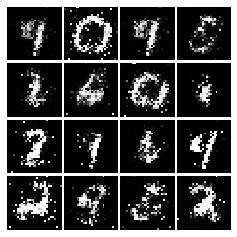

Epoch: 5, Iter: 2600, D: 1.446, G:0.8232


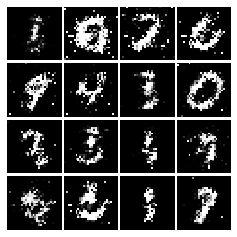

Epoch: 5, Iter: 2620, D: 1.345, G:1.119


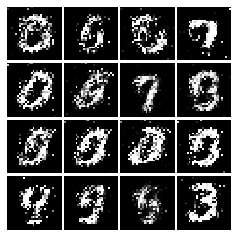

Epoch: 5, Iter: 2640, D: 1.296, G:0.8741


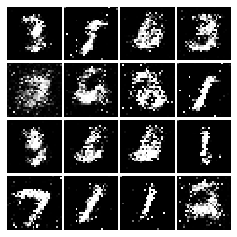

Epoch: 5, Iter: 2660, D: 1.271, G:0.9302


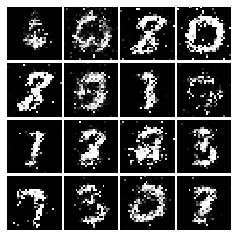

Epoch: 5, Iter: 2680, D: 1.364, G:0.7976


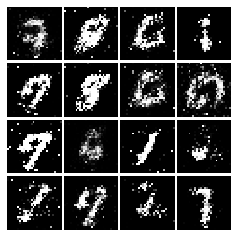

Epoch: 5, Iter: 2700, D: 1.366, G:0.8617


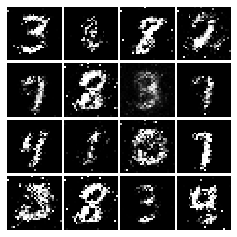

Epoch: 5, Iter: 2720, D: 1.262, G:0.7685


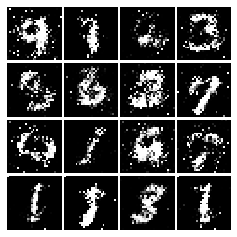

Epoch: 5, Iter: 2740, D: 1.177, G:0.7695


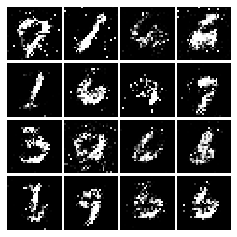

Epoch: 5, Iter: 2760, D: 1.465, G:0.8286


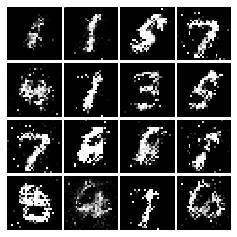

Epoch: 5, Iter: 2780, D: 1.302, G:0.8898


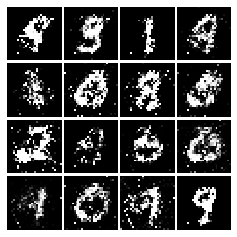

Epoch: 5, Iter: 2800, D: 1.253, G:0.8762


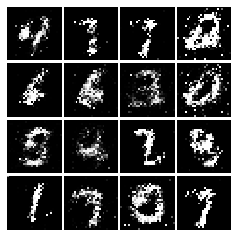

Epoch: 6, Iter: 2820, D: 1.263, G:0.8327


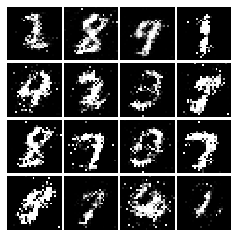

Epoch: 6, Iter: 2840, D: 1.279, G:0.8234


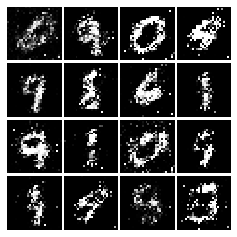

Epoch: 6, Iter: 2860, D: 1.388, G:0.7425


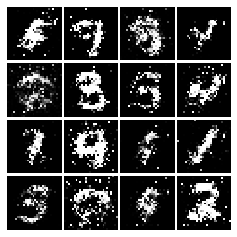

Epoch: 6, Iter: 2880, D: 1.324, G:0.9711


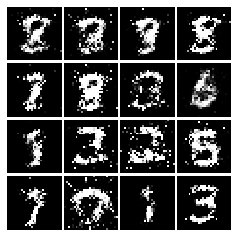

Epoch: 6, Iter: 2900, D: 1.393, G:0.8756


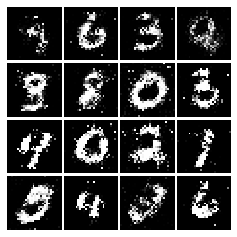

Epoch: 6, Iter: 2920, D: 1.381, G:0.8189


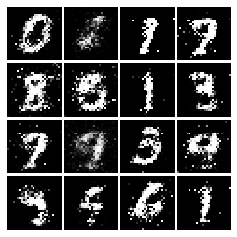

Epoch: 6, Iter: 2940, D: 1.298, G:0.8566


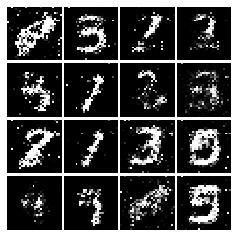

Epoch: 6, Iter: 2960, D: 1.171, G:0.7538


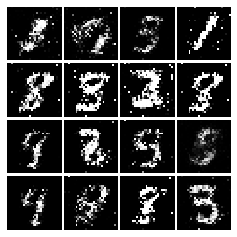

Epoch: 6, Iter: 2980, D: 1.228, G:0.7708


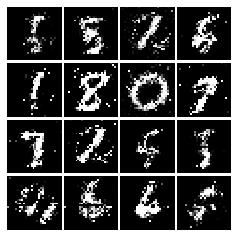

Epoch: 6, Iter: 3000, D: 1.314, G:0.8923


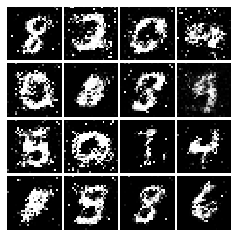

Epoch: 6, Iter: 3020, D: 1.47, G:0.8


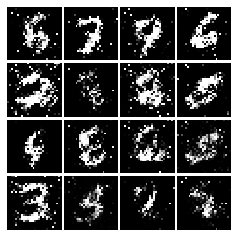

Epoch: 6, Iter: 3040, D: 1.311, G:0.9041


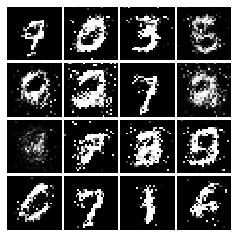

Epoch: 6, Iter: 3060, D: 1.284, G:0.8002


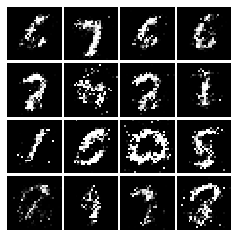

Epoch: 6, Iter: 3080, D: 1.296, G:0.911


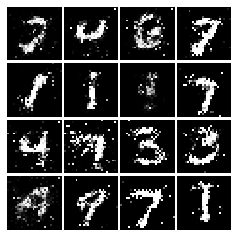

Epoch: 6, Iter: 3100, D: 1.351, G:0.8223


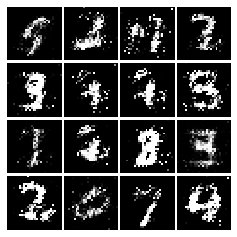

Epoch: 6, Iter: 3120, D: 1.283, G:0.8855


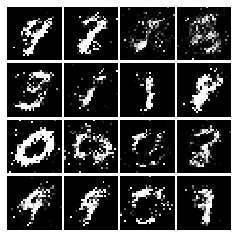

Epoch: 6, Iter: 3140, D: 1.347, G:0.8318


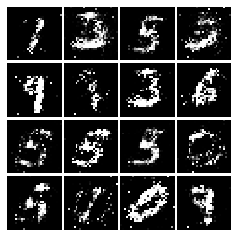

Epoch: 6, Iter: 3160, D: 1.309, G:0.9226


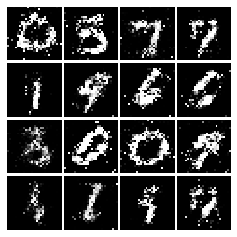

Epoch: 6, Iter: 3180, D: 1.514, G:0.663


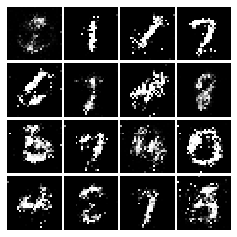

Epoch: 6, Iter: 3200, D: 1.394, G:0.8278


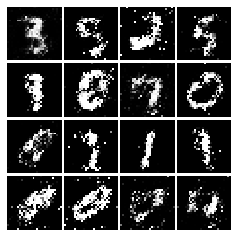

Epoch: 6, Iter: 3220, D: 1.343, G:0.8871


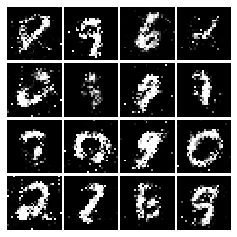

Epoch: 6, Iter: 3240, D: 1.254, G:0.9558


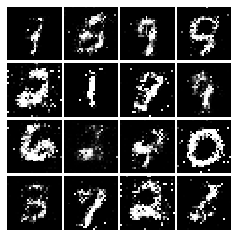

Epoch: 6, Iter: 3260, D: 1.39, G:0.8807


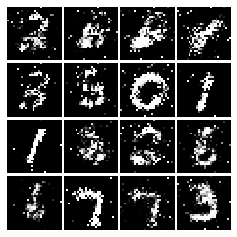

Epoch: 6, Iter: 3280, D: 1.284, G:1.014


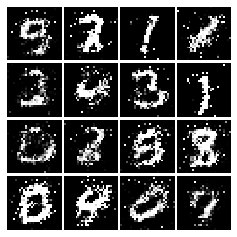

Epoch: 7, Iter: 3300, D: 1.279, G:0.8901


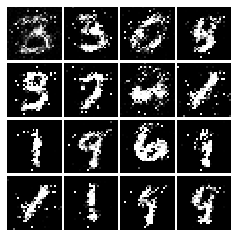

Epoch: 7, Iter: 3320, D: 1.189, G:0.9249


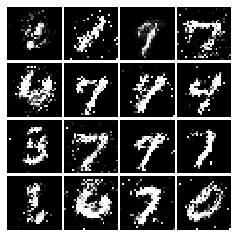

Epoch: 7, Iter: 3340, D: 1.222, G:0.8834


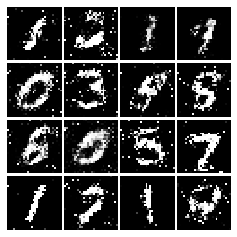

Epoch: 7, Iter: 3360, D: 1.334, G:0.8565


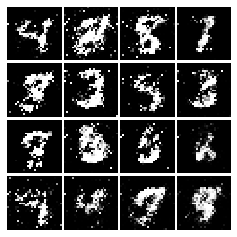

Epoch: 7, Iter: 3380, D: 1.264, G:0.8606


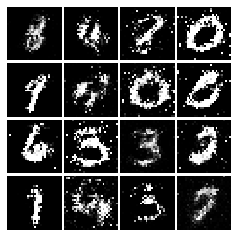

Epoch: 7, Iter: 3400, D: 1.324, G:0.7943


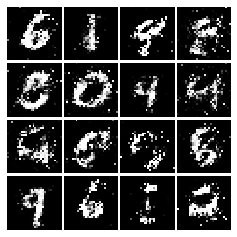

Epoch: 7, Iter: 3420, D: 1.23, G:0.8753


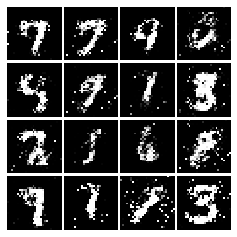

Epoch: 7, Iter: 3440, D: 1.311, G:0.8692


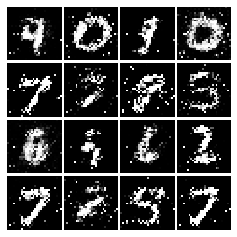

Epoch: 7, Iter: 3460, D: 1.287, G:0.8289


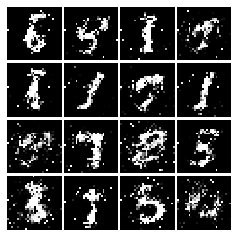

Epoch: 7, Iter: 3480, D: 1.257, G:0.7495


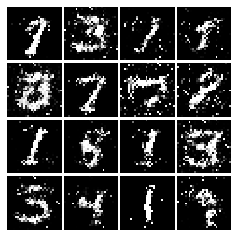

Epoch: 7, Iter: 3500, D: 1.284, G:0.8403


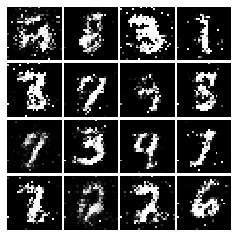

Epoch: 7, Iter: 3520, D: 1.301, G:0.7665


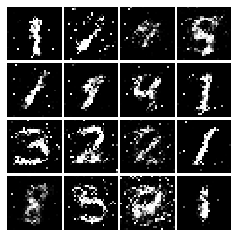

Epoch: 7, Iter: 3540, D: 1.18, G:0.7638


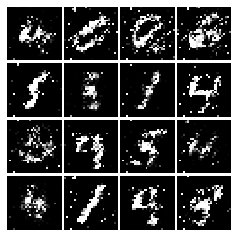

Epoch: 7, Iter: 3560, D: 1.262, G:0.8717


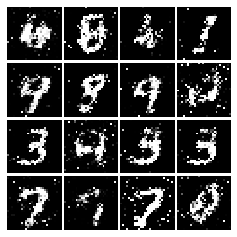

Epoch: 7, Iter: 3580, D: 1.308, G:0.8623


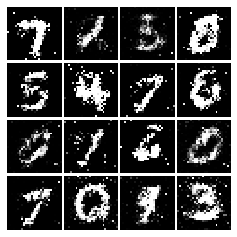

Epoch: 7, Iter: 3600, D: 1.261, G:0.8207


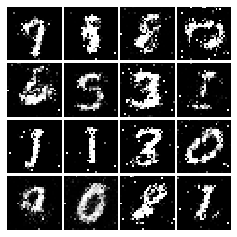

Epoch: 7, Iter: 3620, D: 1.314, G:1.006


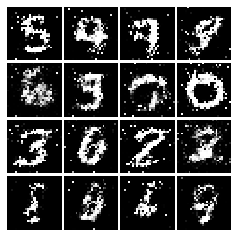

Epoch: 7, Iter: 3640, D: 1.363, G:0.8172


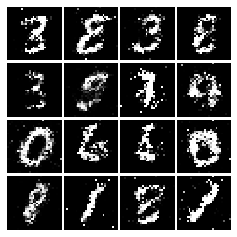

Epoch: 7, Iter: 3660, D: 1.277, G:0.8834


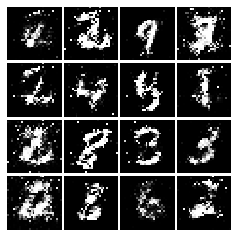

Epoch: 7, Iter: 3680, D: 1.397, G:0.7954


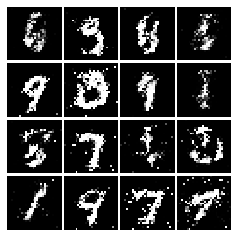

Epoch: 7, Iter: 3700, D: 1.369, G:0.8242


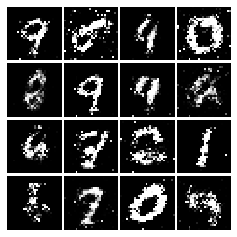

Epoch: 7, Iter: 3720, D: 1.312, G:0.8091


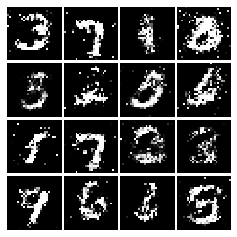

Epoch: 7, Iter: 3740, D: 1.325, G:0.8021


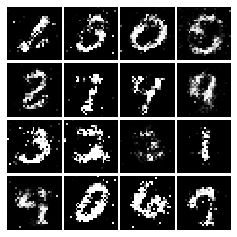

Epoch: 8, Iter: 3760, D: 1.372, G:0.8011


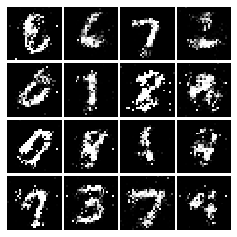

Epoch: 8, Iter: 3780, D: 1.38, G:0.8703


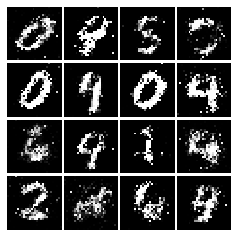

Epoch: 8, Iter: 3800, D: 1.266, G:0.8482


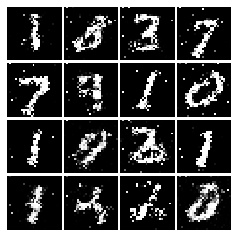

Epoch: 8, Iter: 3820, D: 1.237, G:0.8189


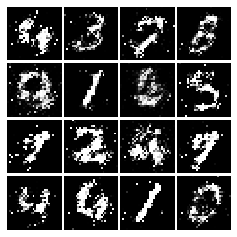

Epoch: 8, Iter: 3840, D: 1.293, G:0.8223


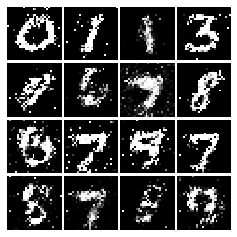

Epoch: 8, Iter: 3860, D: 1.301, G:0.8749


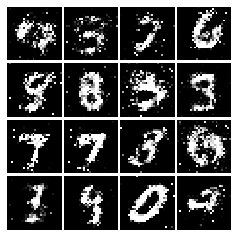

Epoch: 8, Iter: 3880, D: 1.21, G:0.9142


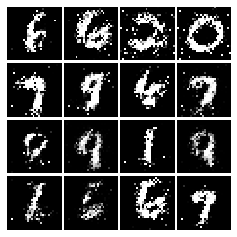

Epoch: 8, Iter: 3900, D: 1.326, G:0.8028


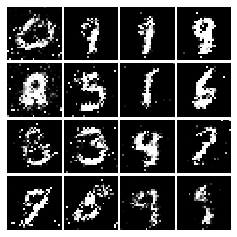

Epoch: 8, Iter: 3920, D: 1.268, G:0.9376


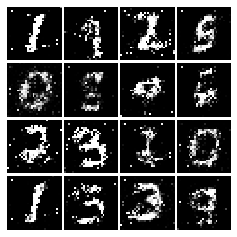

Epoch: 8, Iter: 3940, D: 1.304, G:0.8064


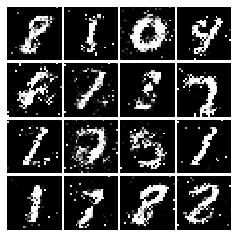

Epoch: 8, Iter: 3960, D: 1.284, G:0.8873


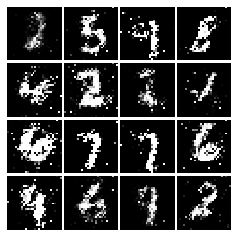

Epoch: 8, Iter: 3980, D: 1.199, G:0.9474


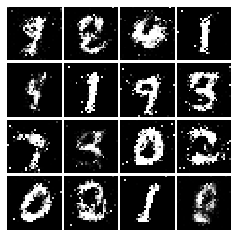

Epoch: 8, Iter: 4000, D: 1.267, G:0.8085


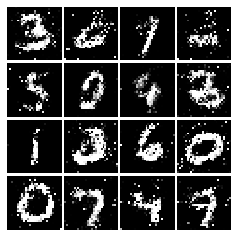

Epoch: 8, Iter: 4020, D: 1.19, G:0.9263


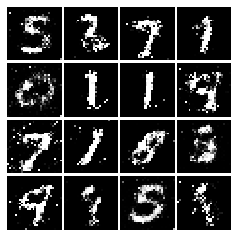

Epoch: 8, Iter: 4040, D: 1.321, G:0.8962


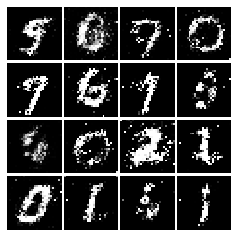

Epoch: 8, Iter: 4060, D: 1.27, G:0.831


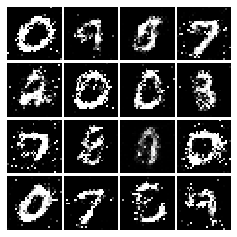

Epoch: 8, Iter: 4080, D: 1.181, G:0.8578


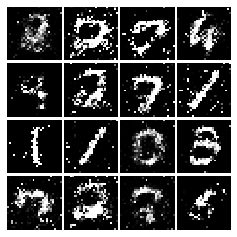

Epoch: 8, Iter: 4100, D: 1.396, G:0.7576


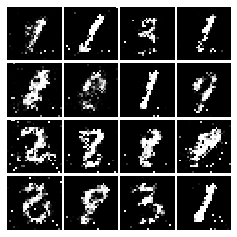

Epoch: 8, Iter: 4120, D: 1.25, G:0.8813


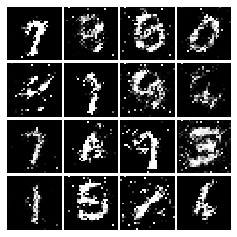

Epoch: 8, Iter: 4140, D: 1.237, G:1.006


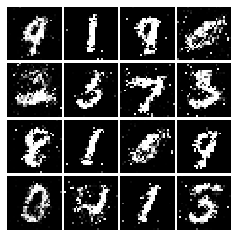

Epoch: 8, Iter: 4160, D: 1.284, G:0.8232


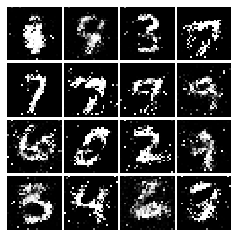

Epoch: 8, Iter: 4180, D: 1.329, G:0.9033


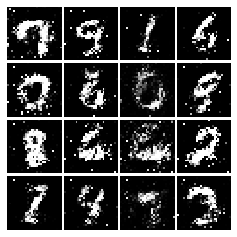

Epoch: 8, Iter: 4200, D: 1.318, G:0.8898


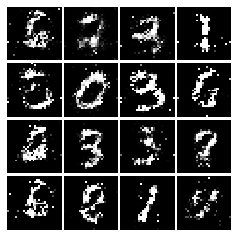

Epoch: 8, Iter: 4220, D: 1.464, G:0.8738


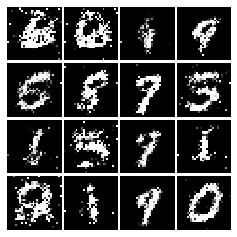

Epoch: 9, Iter: 4240, D: 1.336, G:0.8502


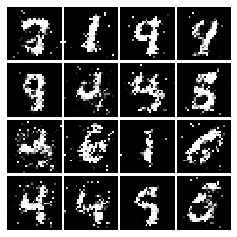

Epoch: 9, Iter: 4260, D: 1.322, G:0.8971


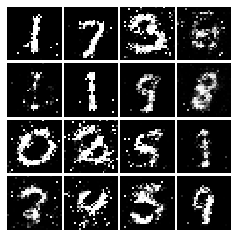

Epoch: 9, Iter: 4280, D: 1.321, G:0.8187


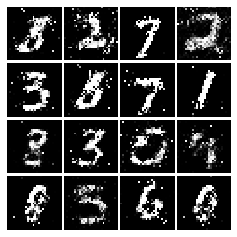

Epoch: 9, Iter: 4300, D: 1.277, G:0.9905


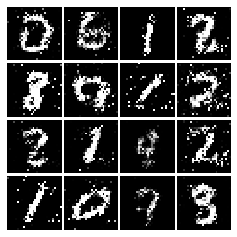

Epoch: 9, Iter: 4320, D: 1.386, G:0.8448


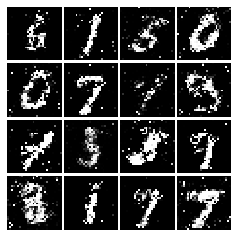

Epoch: 9, Iter: 4340, D: 1.293, G:0.8609


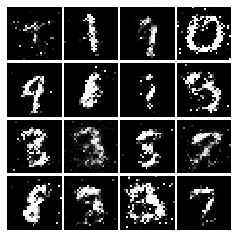

Epoch: 9, Iter: 4360, D: 1.289, G:0.9115


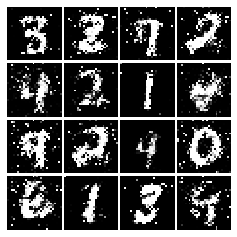

Epoch: 9, Iter: 4380, D: 1.389, G:0.8125


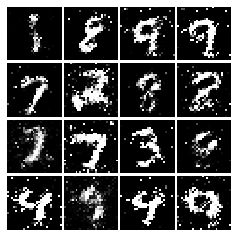

Epoch: 9, Iter: 4400, D: 1.301, G:0.8693


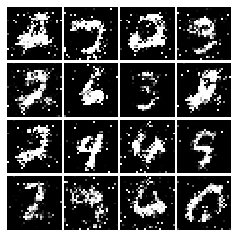

Epoch: 9, Iter: 4420, D: 1.19, G:0.8643


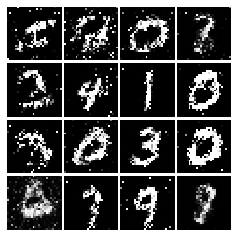

Epoch: 9, Iter: 4440, D: 1.3, G:0.8429


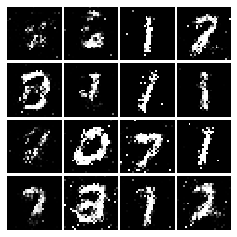

Epoch: 9, Iter: 4460, D: 1.338, G:0.8259


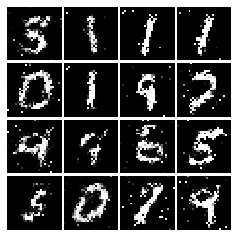

Epoch: 9, Iter: 4480, D: 1.338, G:0.9989


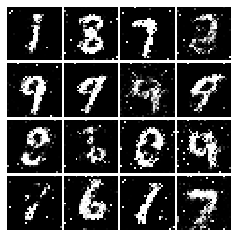

Epoch: 9, Iter: 4500, D: 1.405, G:0.8729


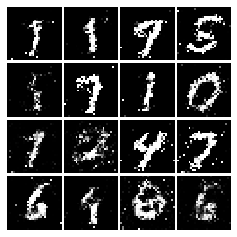

Epoch: 9, Iter: 4520, D: 1.374, G:0.8378


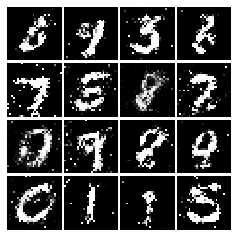

Epoch: 9, Iter: 4540, D: 1.41, G:0.8296


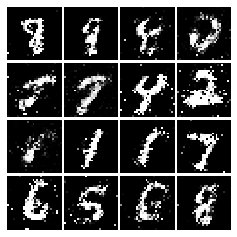

Epoch: 9, Iter: 4560, D: 1.269, G:0.8864


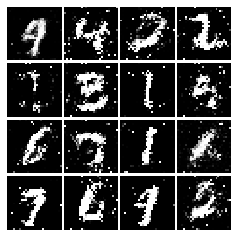

Epoch: 9, Iter: 4580, D: 1.373, G:0.9132


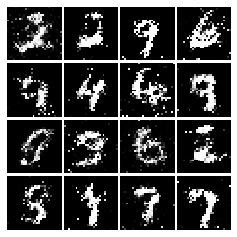

Epoch: 9, Iter: 4600, D: 1.36, G:0.7399


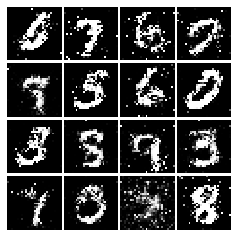

Epoch: 9, Iter: 4620, D: 1.316, G:0.8111


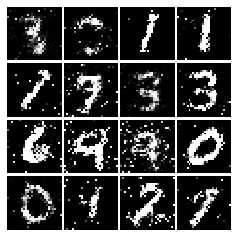

Epoch: 9, Iter: 4640, D: 1.341, G:0.7383


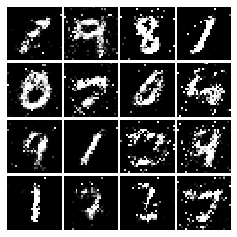

Epoch: 9, Iter: 4660, D: 1.308, G:0.8859


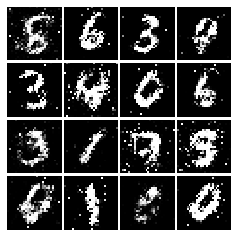

Epoch: 9, Iter: 4680, D: 1.333, G:0.8342


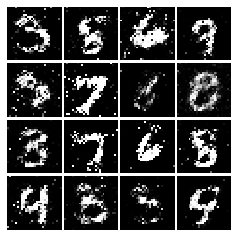

Final images


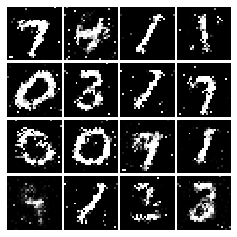

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.121, G:0.4695


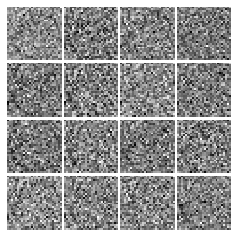

Epoch: 0, Iter: 20, D: 0.03854, G:0.9709


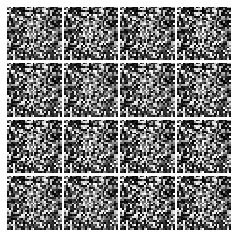

Epoch: 0, Iter: 40, D: 0.02329, G:0.8457


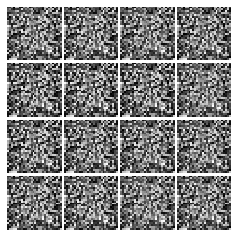

Epoch: 0, Iter: 60, D: 0.05121, G:0.501


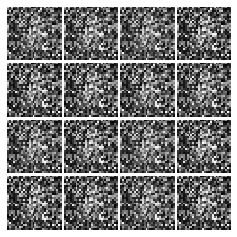

Epoch: 0, Iter: 80, D: 0.01142, G:0.5317


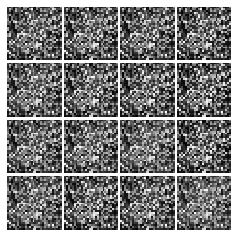

Epoch: 0, Iter: 100, D: 0.04704, G:0.6335


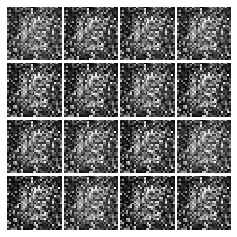

Epoch: 0, Iter: 120, D: 0.4266, G:1.187


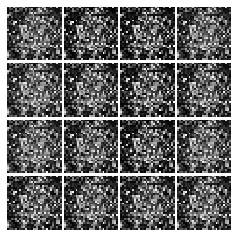

Epoch: 0, Iter: 140, D: 0.5176, G:0.3627


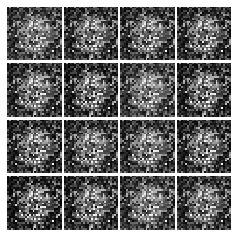

Epoch: 0, Iter: 160, D: 0.115, G:0.638


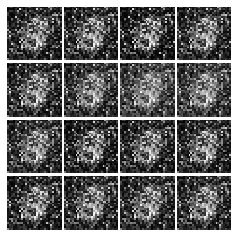

Epoch: 0, Iter: 180, D: 0.1171, G:0.3661


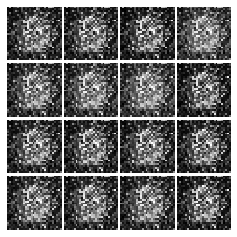

Epoch: 0, Iter: 200, D: 0.2058, G:0.7414


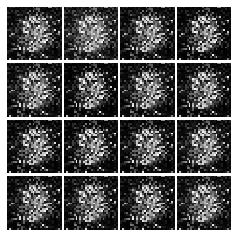

Epoch: 0, Iter: 220, D: 0.4101, G:1.549


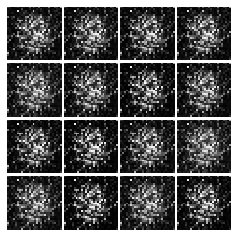

Epoch: 0, Iter: 240, D: 1.307, G:1.984


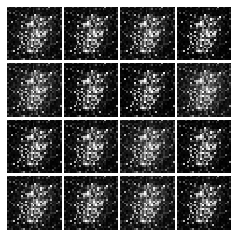

Epoch: 0, Iter: 260, D: 0.1071, G:0.3483


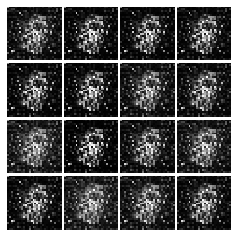

Epoch: 0, Iter: 280, D: 0.09794, G:0.2695


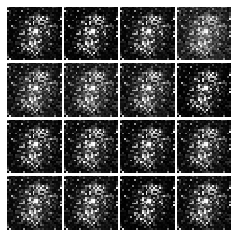

Epoch: 0, Iter: 300, D: 0.1087, G:0.7644


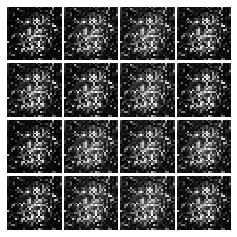

Epoch: 0, Iter: 320, D: 0.1021, G:0.4096


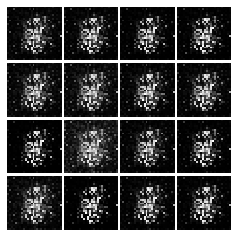

Epoch: 0, Iter: 340, D: 0.1664, G:0.3058


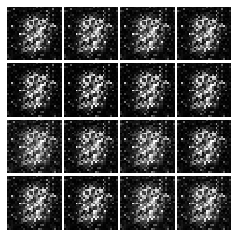

Epoch: 0, Iter: 360, D: 0.1593, G:0.1056


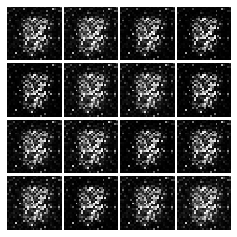

Epoch: 0, Iter: 380, D: 0.1309, G:0.8019


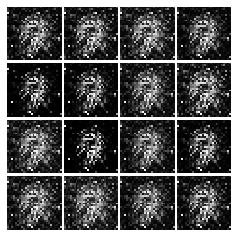

Epoch: 0, Iter: 400, D: 0.1561, G:0.2603


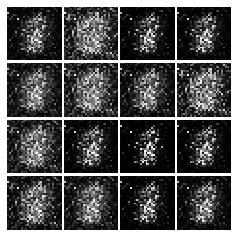

Epoch: 0, Iter: 420, D: 0.2109, G:0.2397


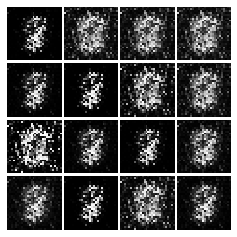

Epoch: 0, Iter: 440, D: 0.1485, G:0.5135


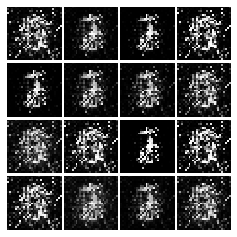

Epoch: 0, Iter: 460, D: 0.08227, G:0.4438


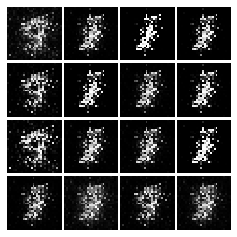

Epoch: 1, Iter: 480, D: 0.266, G:0.7941


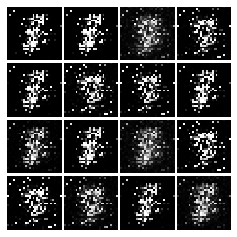

Epoch: 1, Iter: 500, D: 0.6251, G:0.6653


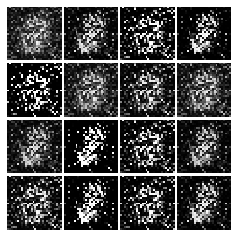

Epoch: 1, Iter: 520, D: 0.1037, G:0.542


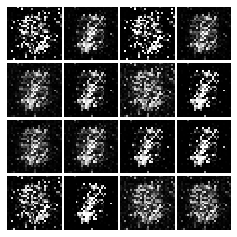

Epoch: 1, Iter: 540, D: 0.2003, G:0.2407


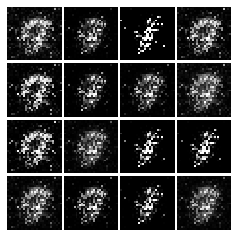

Epoch: 1, Iter: 560, D: 0.1463, G:0.4535


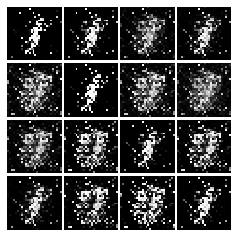

Epoch: 1, Iter: 580, D: 1.456, G:0.8057


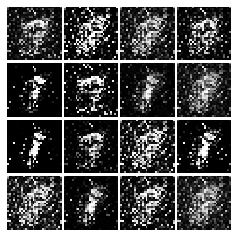

Epoch: 1, Iter: 600, D: 0.2877, G:0.3511


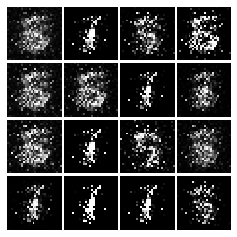

Epoch: 1, Iter: 620, D: 0.1824, G:0.208


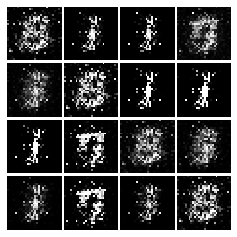

Epoch: 1, Iter: 640, D: 0.1561, G:0.2998


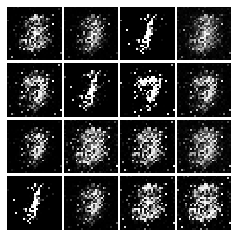

Epoch: 1, Iter: 660, D: 0.2361, G:0.2607


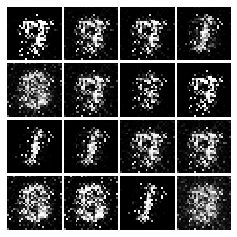

Epoch: 1, Iter: 680, D: 0.1449, G:0.2578


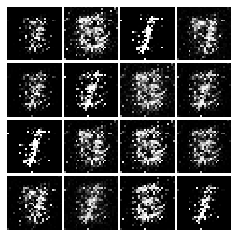

Epoch: 1, Iter: 700, D: 0.198, G:0.2499


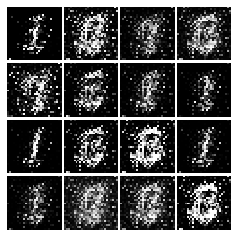

Epoch: 1, Iter: 720, D: 0.1622, G:0.2837


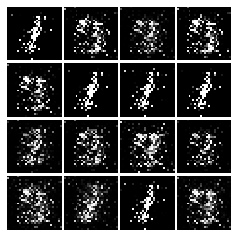

Epoch: 1, Iter: 740, D: 0.2163, G:0.2483


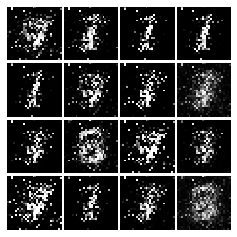

Epoch: 1, Iter: 760, D: 0.1268, G:0.2729


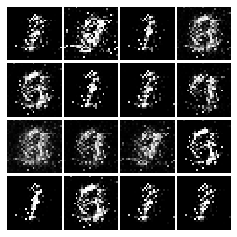

Epoch: 1, Iter: 780, D: 0.1745, G:0.3934


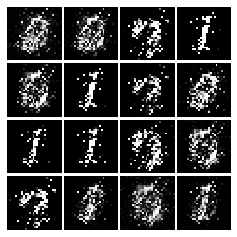

Epoch: 1, Iter: 800, D: 0.1209, G:0.3372


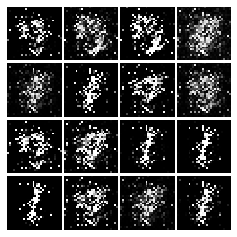

Epoch: 1, Iter: 820, D: 0.07998, G:0.446


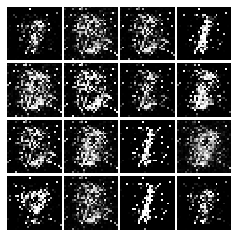

Epoch: 1, Iter: 840, D: 0.1697, G:0.2924


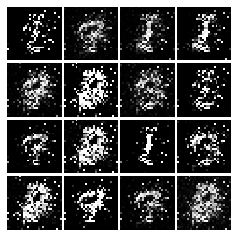

Epoch: 1, Iter: 860, D: 0.1442, G:1.104


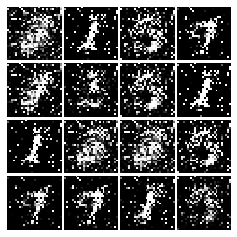

Epoch: 1, Iter: 880, D: 0.1434, G:0.3249


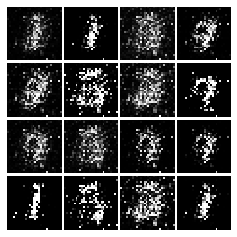

Epoch: 1, Iter: 900, D: 0.1557, G:0.2381


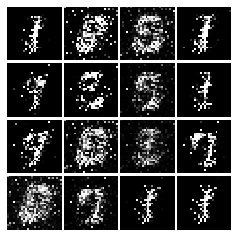

Epoch: 1, Iter: 920, D: 0.2076, G:0.3571


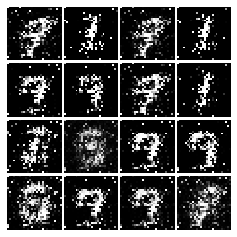

Epoch: 2, Iter: 940, D: 0.1213, G:0.4488


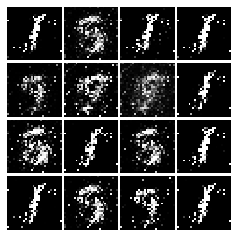

Epoch: 2, Iter: 960, D: 0.3136, G:0.618


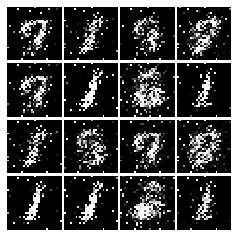

Epoch: 2, Iter: 980, D: 0.1564, G:0.2684


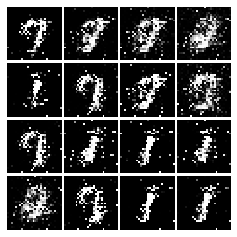

Epoch: 2, Iter: 1000, D: 0.217, G:0.8069


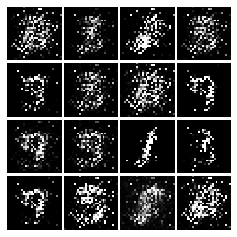

Epoch: 2, Iter: 1020, D: 0.1152, G:0.4218


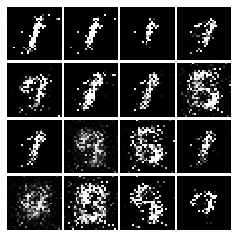

Epoch: 2, Iter: 1040, D: 0.1548, G:0.2955


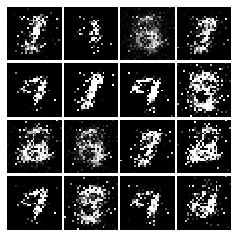

Epoch: 2, Iter: 1060, D: 0.08489, G:0.4071


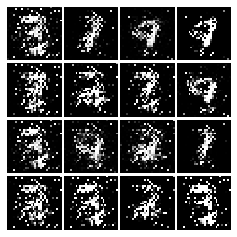

Epoch: 2, Iter: 1080, D: 0.2038, G:0.3271


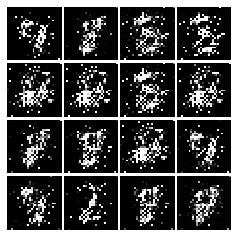

Epoch: 2, Iter: 1100, D: 0.2011, G:0.307


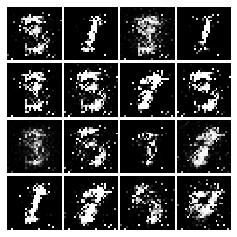

Epoch: 2, Iter: 1120, D: 0.1321, G:0.3562


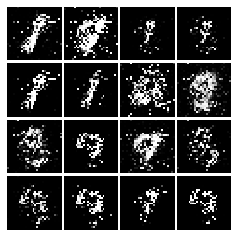

Epoch: 2, Iter: 1140, D: 0.2221, G:0.3162


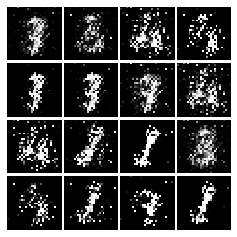

Epoch: 2, Iter: 1160, D: 0.1748, G:0.475


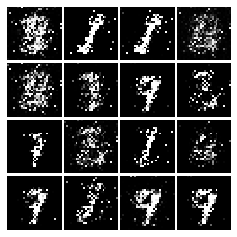

Epoch: 2, Iter: 1180, D: 0.1988, G:0.212


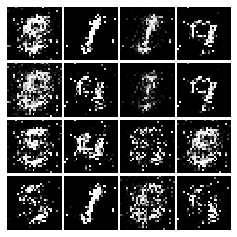

Epoch: 2, Iter: 1200, D: 0.1978, G:0.2848


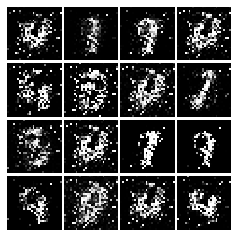

Epoch: 2, Iter: 1220, D: 0.1297, G:0.3016


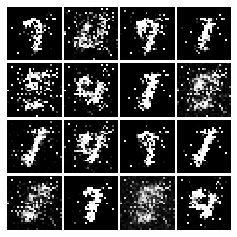

Epoch: 2, Iter: 1240, D: 0.1978, G:0.1406


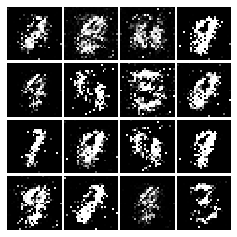

Epoch: 2, Iter: 1260, D: 0.1699, G:0.1949


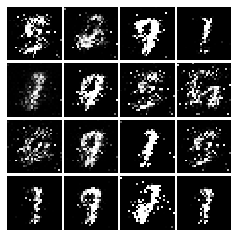

Epoch: 2, Iter: 1280, D: 0.1757, G:0.257


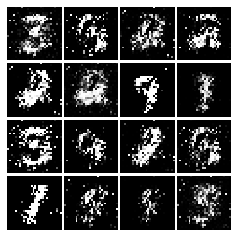

Epoch: 2, Iter: 1300, D: 0.1938, G:0.2952


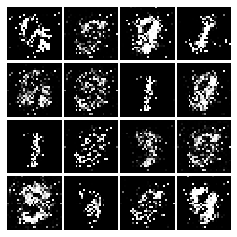

Epoch: 2, Iter: 1320, D: 0.1793, G:0.2298


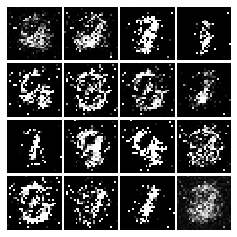

Epoch: 2, Iter: 1340, D: 0.1879, G:0.2195


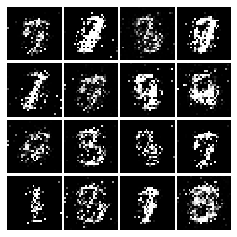

Epoch: 2, Iter: 1360, D: 0.1675, G:0.2864


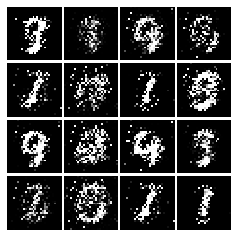

Epoch: 2, Iter: 1380, D: 0.1323, G:0.1873


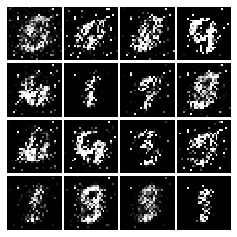

Epoch: 2, Iter: 1400, D: 0.152, G:0.2141


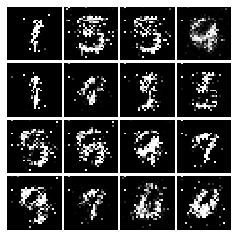

Epoch: 3, Iter: 1420, D: 0.2062, G:0.3028


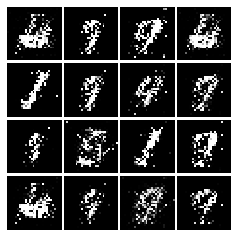

Epoch: 3, Iter: 1440, D: 0.1507, G:0.2516


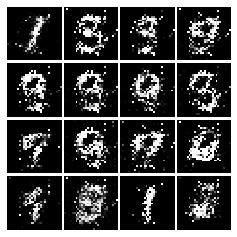

Epoch: 3, Iter: 1460, D: 0.1732, G:0.35


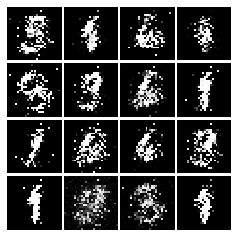

Epoch: 3, Iter: 1480, D: 0.119, G:0.4163


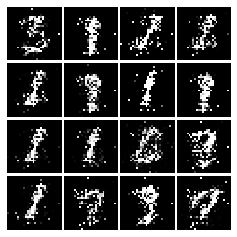

Epoch: 3, Iter: 1500, D: 0.1581, G:0.3622


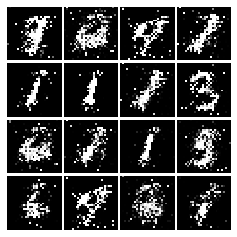

Epoch: 3, Iter: 1520, D: 0.2485, G:0.2705


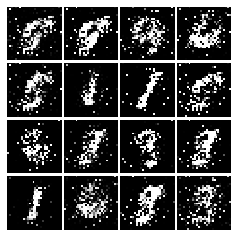

Epoch: 3, Iter: 1540, D: 0.1799, G:0.2088


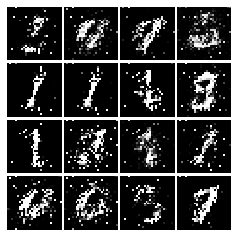

Epoch: 3, Iter: 1560, D: 0.1577, G:0.2428


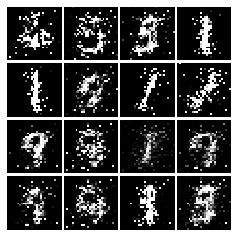

Epoch: 3, Iter: 1580, D: 0.1669, G:0.2466


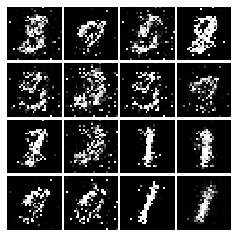

Epoch: 3, Iter: 1600, D: 0.1964, G:0.287


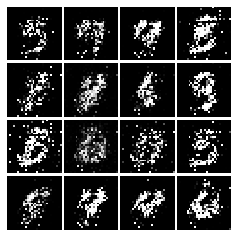

Epoch: 3, Iter: 1620, D: 0.14, G:0.2879


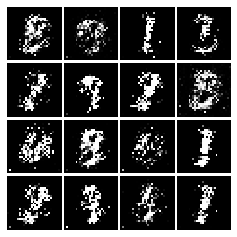

Epoch: 3, Iter: 1640, D: 0.1807, G:0.2318


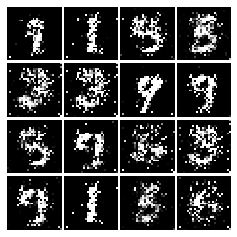

Epoch: 3, Iter: 1660, D: 0.1879, G:0.2327


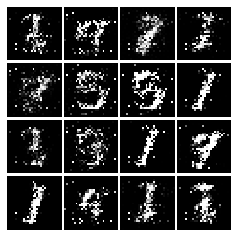

Epoch: 3, Iter: 1680, D: 0.3842, G:0.04814


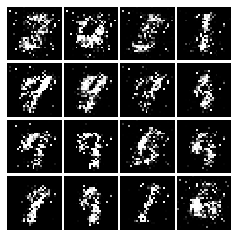

Epoch: 3, Iter: 1700, D: 0.1777, G:0.21


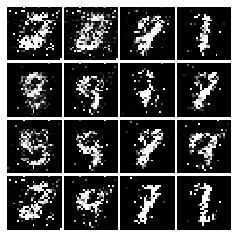

Epoch: 3, Iter: 1720, D: 0.1683, G:0.2968


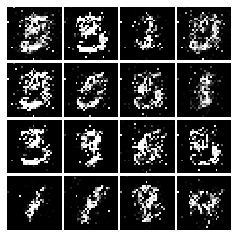

Epoch: 3, Iter: 1740, D: 0.1748, G:0.2679


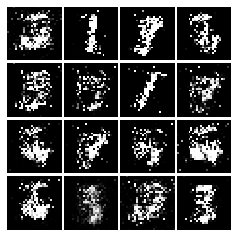

Epoch: 3, Iter: 1760, D: 0.2144, G:0.3018


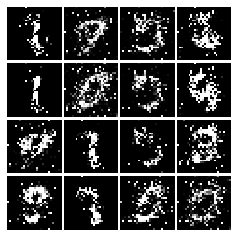

Epoch: 3, Iter: 1780, D: 0.1671, G:0.2442


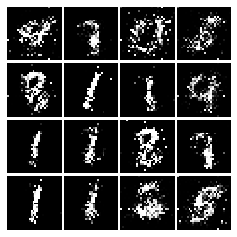

Epoch: 3, Iter: 1800, D: 0.2238, G:0.2224


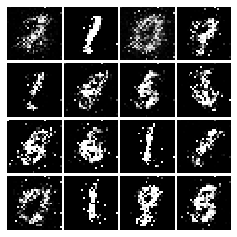

Epoch: 3, Iter: 1820, D: 0.2025, G:0.2353


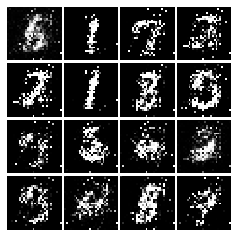

Epoch: 3, Iter: 1840, D: 0.2274, G:0.1694


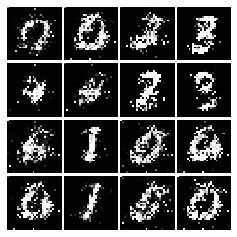

Epoch: 3, Iter: 1860, D: 0.2079, G:0.2096


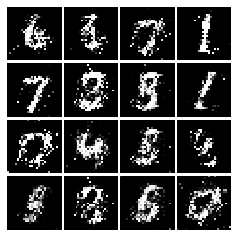

Epoch: 4, Iter: 1880, D: 0.2066, G:0.2268


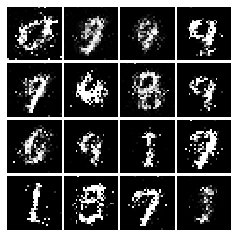

Epoch: 4, Iter: 1900, D: 0.2258, G:0.1941


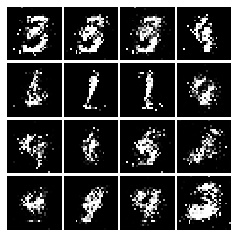

Epoch: 4, Iter: 1920, D: 0.1717, G:0.2295


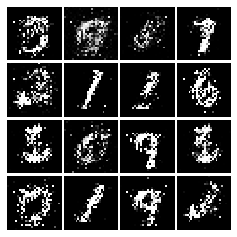

Epoch: 4, Iter: 1940, D: 0.2202, G:0.1954


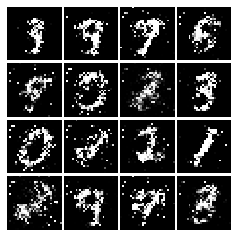

Epoch: 4, Iter: 1960, D: 0.1819, G:0.2378


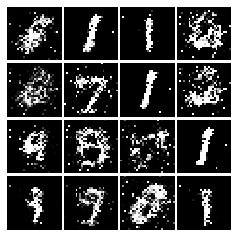

Epoch: 4, Iter: 1980, D: 0.2253, G:0.2066


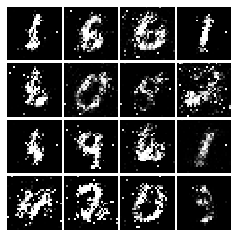

Epoch: 4, Iter: 2000, D: 0.2497, G:0.1888


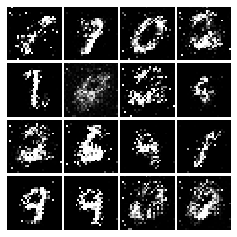

Epoch: 4, Iter: 2020, D: 0.205, G:0.213


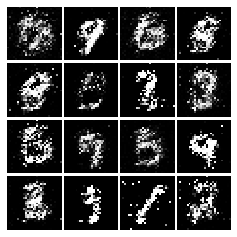

Epoch: 4, Iter: 2040, D: 0.211, G:0.2152


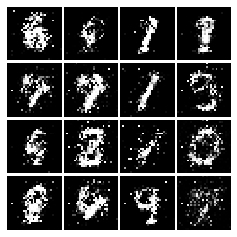

Epoch: 4, Iter: 2060, D: 0.2371, G:0.1719


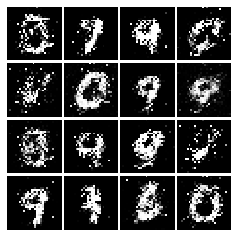

Epoch: 4, Iter: 2080, D: 0.2293, G:0.192


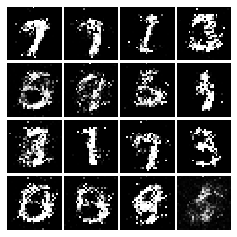

Epoch: 4, Iter: 2100, D: 0.213, G:0.2156


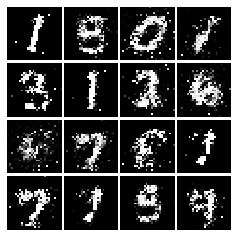

Epoch: 4, Iter: 2120, D: 0.2193, G:0.1887


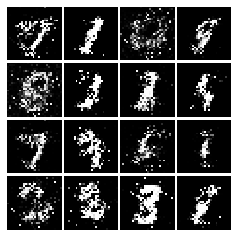

Epoch: 4, Iter: 2140, D: 0.2285, G:0.197


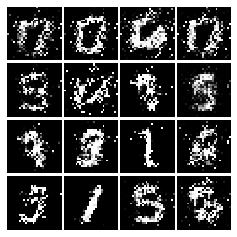

Epoch: 4, Iter: 2160, D: 0.2091, G:0.1765


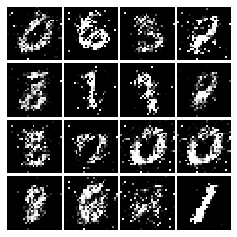

Epoch: 4, Iter: 2180, D: 0.2482, G:0.05346


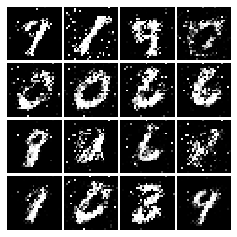

Epoch: 4, Iter: 2200, D: 0.2181, G:0.1574


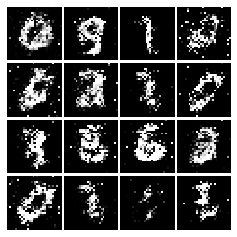

Epoch: 4, Iter: 2220, D: 0.2057, G:0.2169


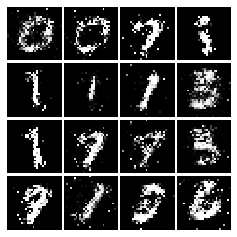

Epoch: 4, Iter: 2240, D: 0.2318, G:0.2032


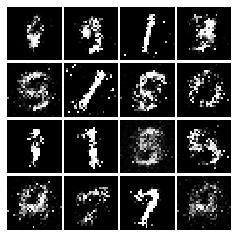

Epoch: 4, Iter: 2260, D: 0.2149, G:0.2022


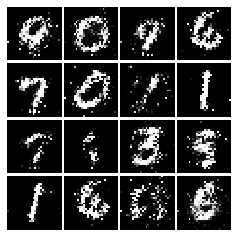

Epoch: 4, Iter: 2280, D: 0.2215, G:0.1813


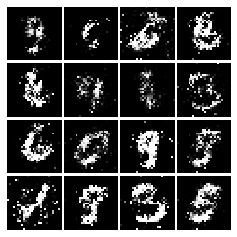

Epoch: 4, Iter: 2300, D: 0.2816, G:0.2598


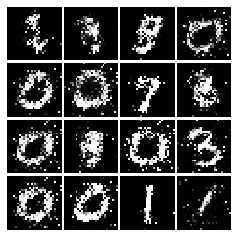

Epoch: 4, Iter: 2320, D: 0.2336, G:0.1972


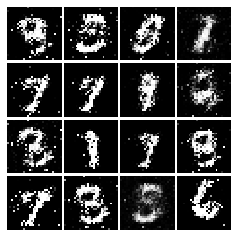

Epoch: 4, Iter: 2340, D: 0.1829, G:0.243


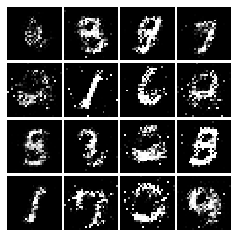

Epoch: 5, Iter: 2360, D: 0.2795, G:0.213


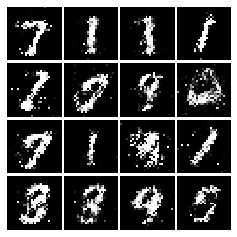

Epoch: 5, Iter: 2380, D: 0.2167, G:0.1632


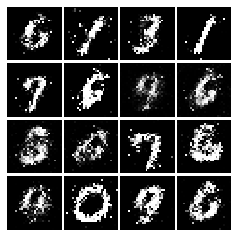

Epoch: 5, Iter: 2400, D: 0.2252, G:0.1774


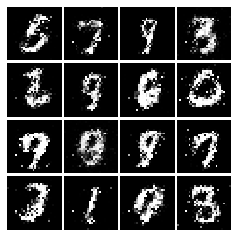

Epoch: 5, Iter: 2420, D: 0.2053, G:0.2122


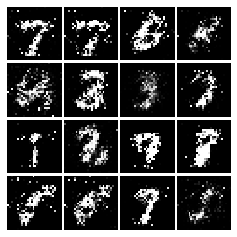

Epoch: 5, Iter: 2440, D: 0.2076, G:0.1939


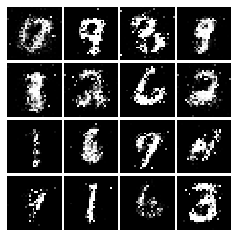

Epoch: 5, Iter: 2460, D: 0.2075, G:0.205


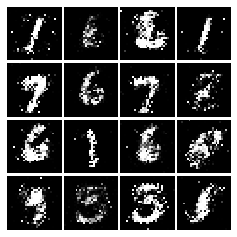

Epoch: 5, Iter: 2480, D: 0.2233, G:0.1551


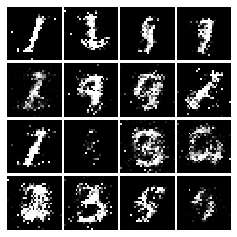

Epoch: 5, Iter: 2500, D: 0.1951, G:0.1771


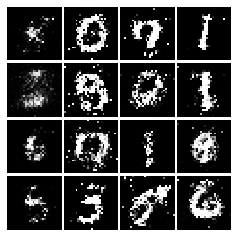

Epoch: 5, Iter: 2520, D: 0.2475, G:0.1706


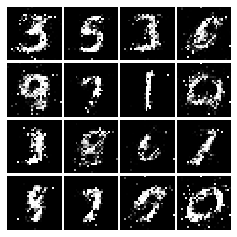

Epoch: 5, Iter: 2540, D: 0.2356, G:0.1876


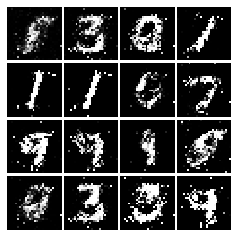

Epoch: 5, Iter: 2560, D: 0.2283, G:0.1642


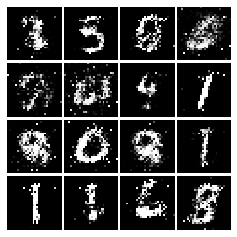

Epoch: 5, Iter: 2580, D: 0.2216, G:0.1596


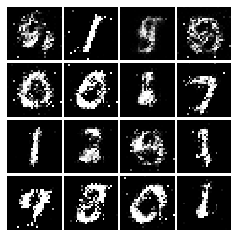

Epoch: 5, Iter: 2600, D: 0.2805, G:0.1378


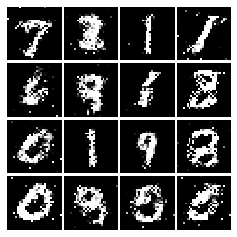

Epoch: 5, Iter: 2620, D: 0.2249, G:0.1714


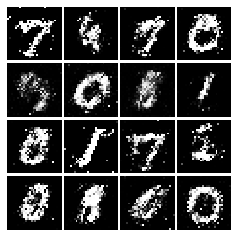

Epoch: 5, Iter: 2640, D: 0.2251, G:0.1833


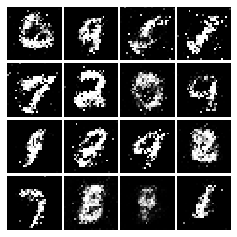

Epoch: 5, Iter: 2660, D: 0.2171, G:0.2462


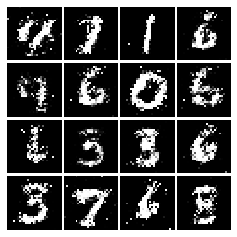

Epoch: 5, Iter: 2680, D: 0.2497, G:0.1453


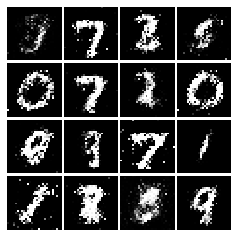

Epoch: 5, Iter: 2700, D: 0.2311, G:0.16


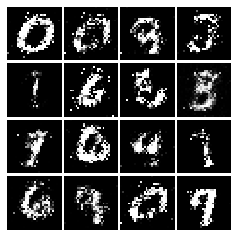

Epoch: 5, Iter: 2720, D: 0.2211, G:0.1636


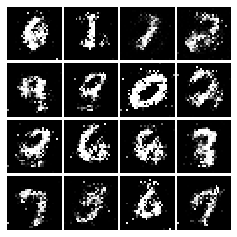

Epoch: 5, Iter: 2740, D: 0.2202, G:0.1646


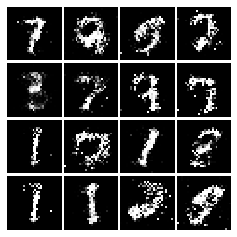

Epoch: 5, Iter: 2760, D: 0.2406, G:0.1595


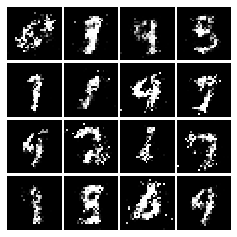

Epoch: 5, Iter: 2780, D: 0.2086, G:0.1608


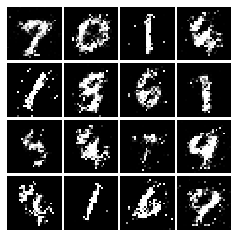

Epoch: 5, Iter: 2800, D: 0.25, G:0.1505


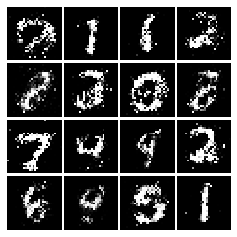

Epoch: 6, Iter: 2820, D: 0.2455, G:0.1649


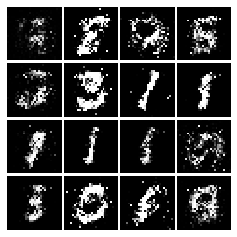

Epoch: 6, Iter: 2840, D: 0.2342, G:0.163


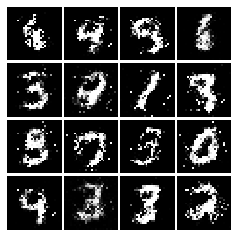

Epoch: 6, Iter: 2860, D: 0.218, G:0.1557


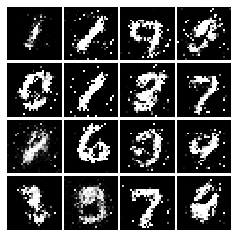

Epoch: 6, Iter: 2880, D: 0.2099, G:0.1683


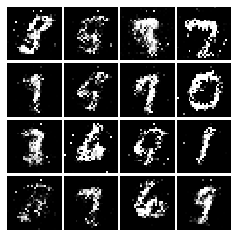

Epoch: 6, Iter: 2900, D: 0.2366, G:0.1487


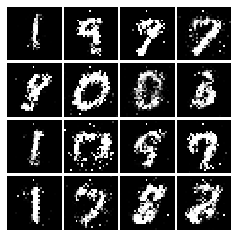

Epoch: 6, Iter: 2920, D: 0.2561, G:0.1639


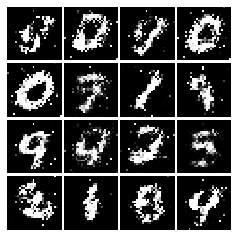

Epoch: 6, Iter: 2940, D: 0.2294, G:0.2658


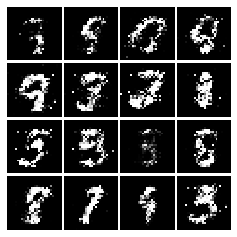

Epoch: 6, Iter: 2960, D: 0.2272, G:0.1793


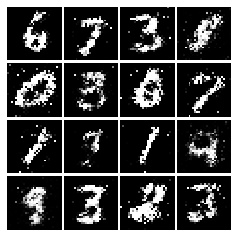

Epoch: 6, Iter: 2980, D: 0.2346, G:0.1561


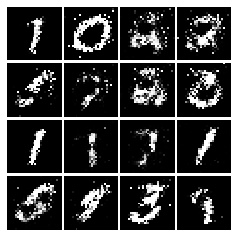

Epoch: 6, Iter: 3000, D: 0.2166, G:0.1781


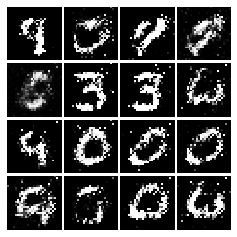

Epoch: 6, Iter: 3020, D: 0.2278, G:0.1732


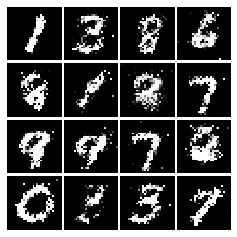

Epoch: 6, Iter: 3040, D: 0.2355, G:0.1405


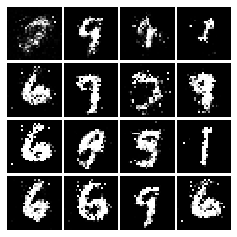

Epoch: 6, Iter: 3060, D: 0.1999, G:0.1673


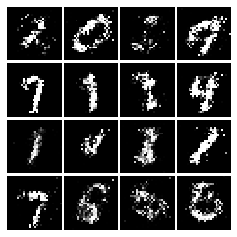

Epoch: 6, Iter: 3080, D: 0.2082, G:0.185


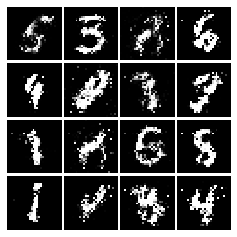

Epoch: 6, Iter: 3100, D: 0.2515, G:0.1801


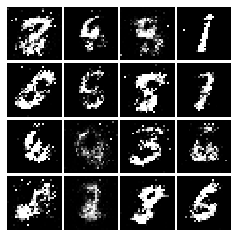

Epoch: 6, Iter: 3120, D: 0.2476, G:0.149


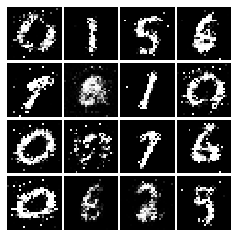

Epoch: 6, Iter: 3140, D: 0.2499, G:0.1533


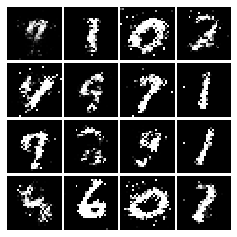

Epoch: 6, Iter: 3160, D: 0.2058, G:0.1555


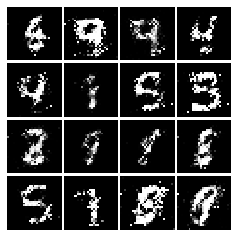

Epoch: 6, Iter: 3180, D: 0.2202, G:0.1577


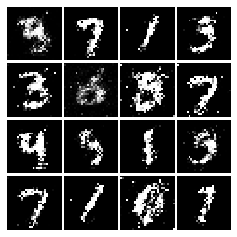

Epoch: 6, Iter: 3200, D: 0.228, G:0.1682


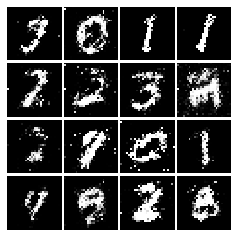

Epoch: 6, Iter: 3220, D: 0.2214, G:0.1566


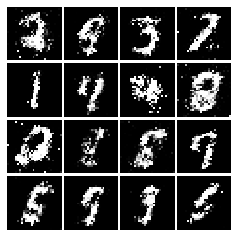

Epoch: 6, Iter: 3240, D: 0.2242, G:0.1536


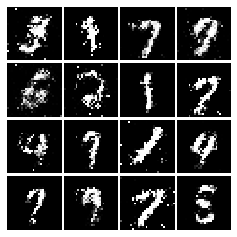

Epoch: 6, Iter: 3260, D: 0.2201, G:0.1657


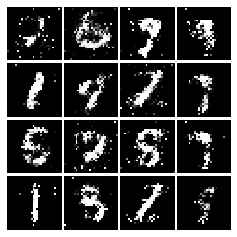

Epoch: 6, Iter: 3280, D: 0.2296, G:0.1491


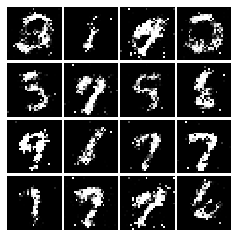

Epoch: 7, Iter: 3300, D: 0.2182, G:0.1693


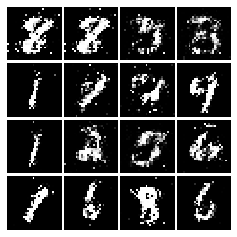

Epoch: 7, Iter: 3320, D: 0.222, G:0.1861


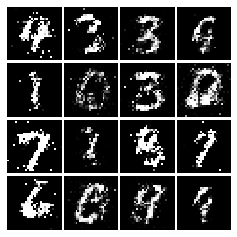

Epoch: 7, Iter: 3340, D: 0.2265, G:0.175


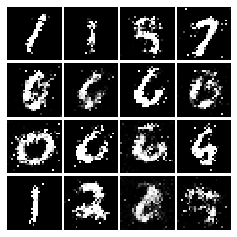

Epoch: 7, Iter: 3360, D: 0.2512, G:0.18


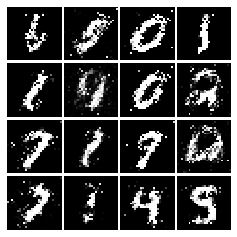

Epoch: 7, Iter: 3380, D: 0.2451, G:0.1709


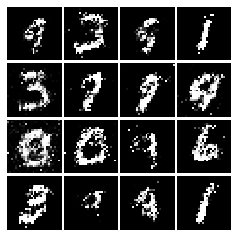

Epoch: 7, Iter: 3400, D: 0.2629, G:0.2082


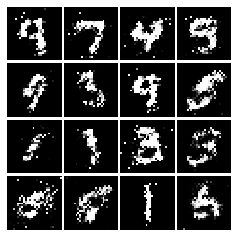

Epoch: 7, Iter: 3420, D: 0.233, G:0.1629


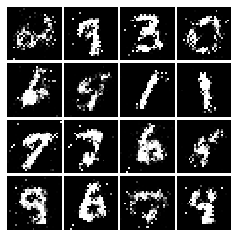

Epoch: 7, Iter: 3440, D: 0.2398, G:0.1875


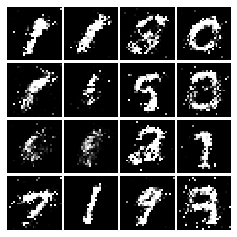

Epoch: 7, Iter: 3460, D: 0.2133, G:0.1593


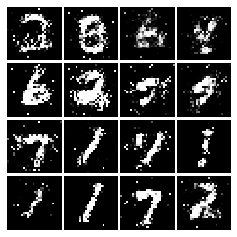

Epoch: 7, Iter: 3480, D: 0.2265, G:0.1557


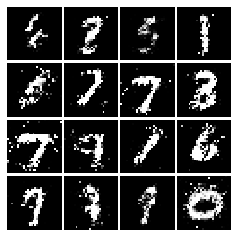

Epoch: 7, Iter: 3500, D: 0.2284, G:0.1454


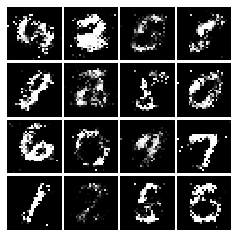

Epoch: 7, Iter: 3520, D: 0.2357, G:0.1381


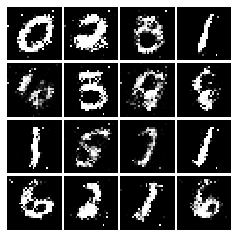

Epoch: 7, Iter: 3540, D: 0.2247, G:0.1616


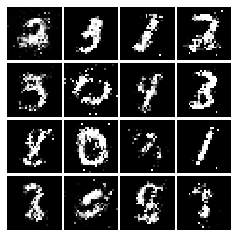

Epoch: 7, Iter: 3560, D: 0.2208, G:0.1659


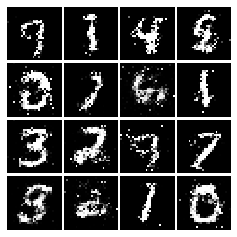

Epoch: 7, Iter: 3580, D: 0.2316, G:0.1666


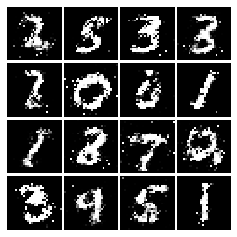

Epoch: 7, Iter: 3600, D: 0.2348, G:0.1577


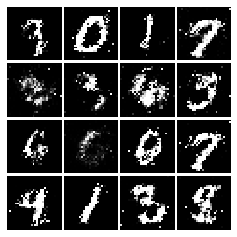

Epoch: 7, Iter: 3620, D: 0.2375, G:0.1561


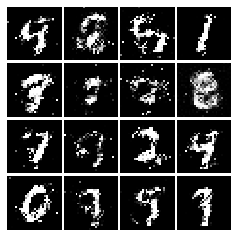

Epoch: 7, Iter: 3640, D: 0.2261, G:0.1801


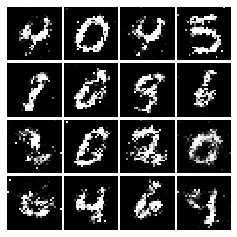

Epoch: 7, Iter: 3660, D: 0.2352, G:0.1708


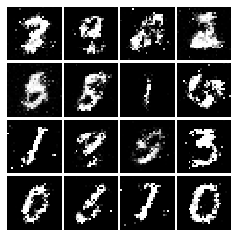

Epoch: 7, Iter: 3680, D: 0.2336, G:0.1528


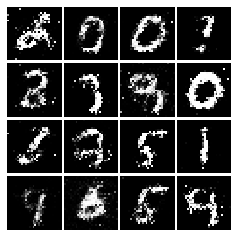

Epoch: 7, Iter: 3700, D: 0.2511, G:0.1564


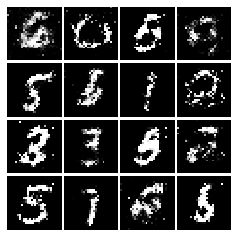

Epoch: 7, Iter: 3720, D: 0.2343, G:0.1493


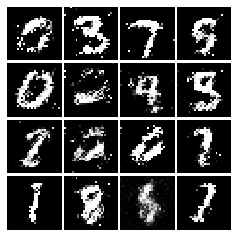

Epoch: 7, Iter: 3740, D: 0.2522, G:0.1353


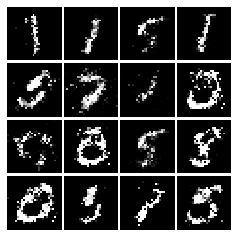

Epoch: 8, Iter: 3760, D: 0.242, G:0.1566


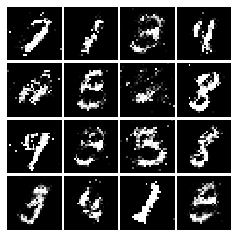

Epoch: 8, Iter: 3780, D: 0.2311, G:0.153


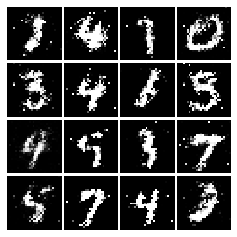

Epoch: 8, Iter: 3800, D: 0.2278, G:0.1591


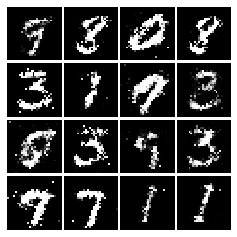

Epoch: 8, Iter: 3820, D: 0.2448, G:0.1677


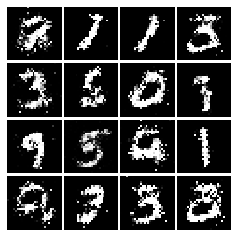

Epoch: 8, Iter: 3840, D: 0.2489, G:0.1691


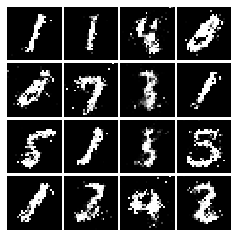

Epoch: 8, Iter: 3860, D: 0.2375, G:0.1432


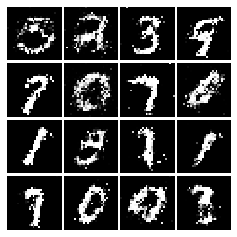

Epoch: 8, Iter: 3880, D: 0.2291, G:0.1586


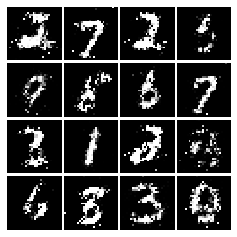

Epoch: 8, Iter: 3900, D: 0.2425, G:0.1483


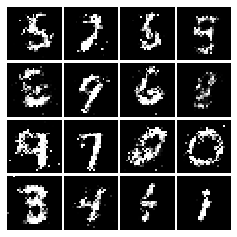

Epoch: 8, Iter: 3920, D: 0.2234, G:0.1634


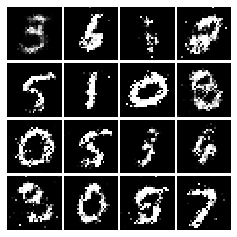

Epoch: 8, Iter: 3940, D: 0.2297, G:0.1712


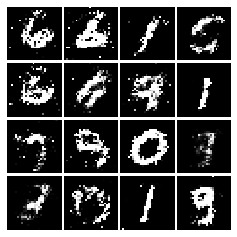

Epoch: 8, Iter: 3960, D: 0.2206, G:0.1468


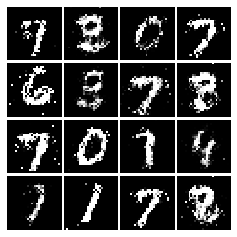

Epoch: 8, Iter: 3980, D: 0.2449, G:0.1492


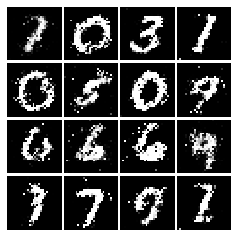

Epoch: 8, Iter: 4000, D: 0.2177, G:0.1507


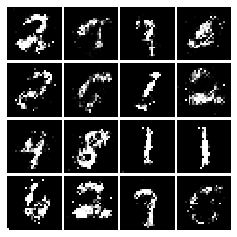

Epoch: 8, Iter: 4020, D: 0.2523, G:0.1437


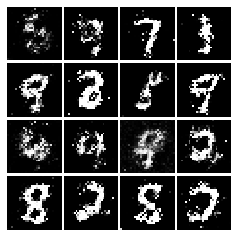

Epoch: 8, Iter: 4040, D: 0.2253, G:0.1652


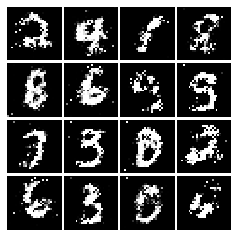

Epoch: 8, Iter: 4060, D: 0.2395, G:0.143


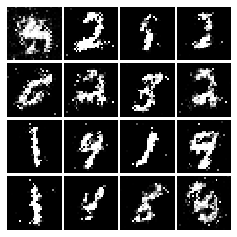

Epoch: 8, Iter: 4080, D: 0.2253, G:0.155


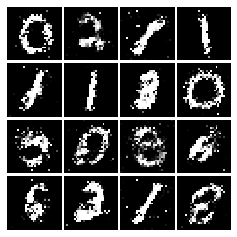

Epoch: 8, Iter: 4100, D: 0.2356, G:0.1604


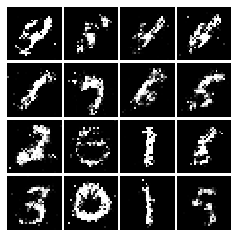

Epoch: 8, Iter: 4120, D: 0.2271, G:0.1809


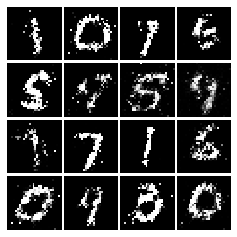

Epoch: 8, Iter: 4140, D: 0.2269, G:0.1687


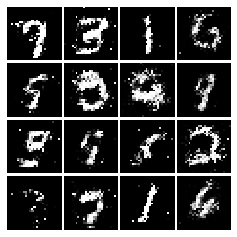

Epoch: 8, Iter: 4160, D: 0.2279, G:0.1845


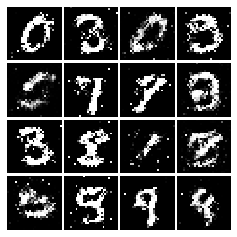

Epoch: 8, Iter: 4180, D: 0.222, G:0.1586


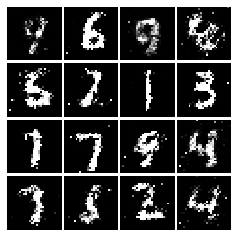

Epoch: 8, Iter: 4200, D: 0.2529, G:0.195


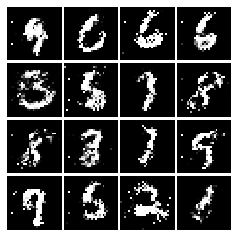

Epoch: 8, Iter: 4220, D: 0.2197, G:0.1697


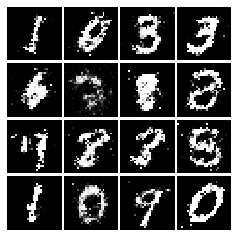

Epoch: 9, Iter: 4240, D: 0.2337, G:0.1529


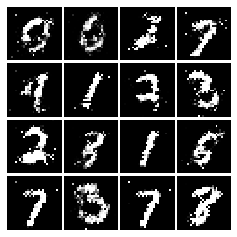

Epoch: 9, Iter: 4260, D: 0.2725, G:0.1484


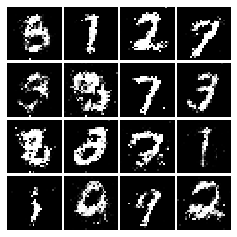

Epoch: 9, Iter: 4280, D: 0.2647, G:0.1388


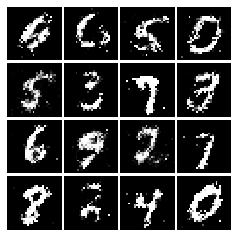

Epoch: 9, Iter: 4300, D: 0.2342, G:0.1796


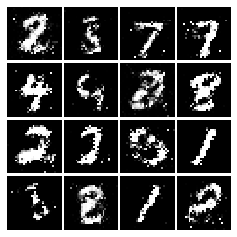

Epoch: 9, Iter: 4320, D: 0.2545, G:0.1646


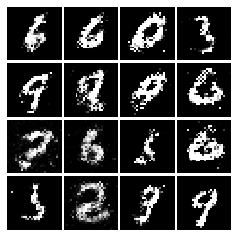

Epoch: 9, Iter: 4340, D: 0.243, G:0.1739


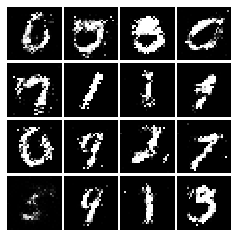

Epoch: 9, Iter: 4360, D: 0.2327, G:0.1463


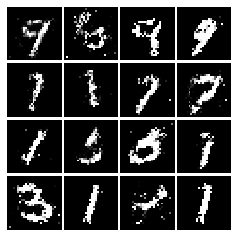

Epoch: 9, Iter: 4380, D: 0.2492, G:0.1665


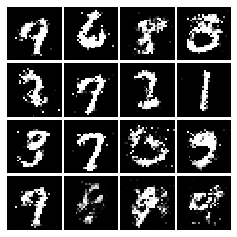

Epoch: 9, Iter: 4400, D: 0.2439, G:0.1652


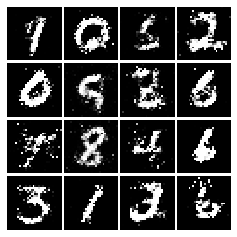

Epoch: 9, Iter: 4420, D: 0.2182, G:0.1364


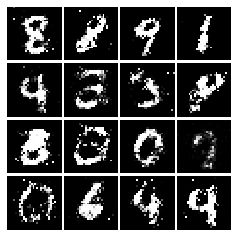

Epoch: 9, Iter: 4440, D: 0.2428, G:0.1308


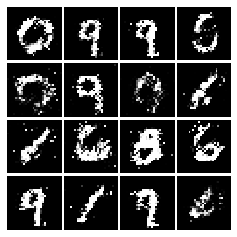

Epoch: 9, Iter: 4460, D: 0.2303, G:0.1561


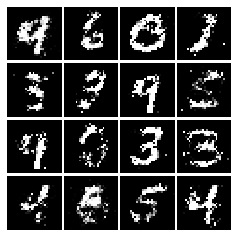

Epoch: 9, Iter: 4480, D: 0.2389, G:0.1423


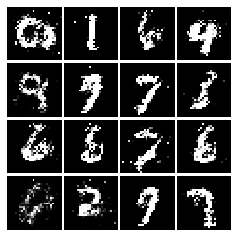

Epoch: 9, Iter: 4500, D: 0.2658, G:0.1546


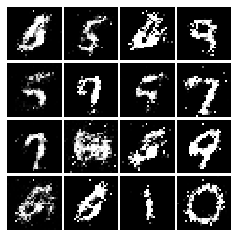

Epoch: 9, Iter: 4520, D: 0.2413, G:0.1451


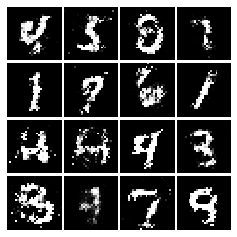

Epoch: 9, Iter: 4540, D: 0.2378, G:0.1547


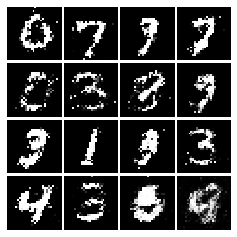

Epoch: 9, Iter: 4560, D: 0.2258, G:0.1482


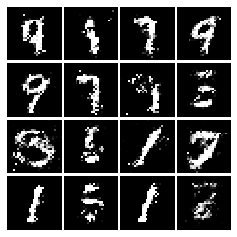

Epoch: 9, Iter: 4580, D: 0.2357, G:0.1732


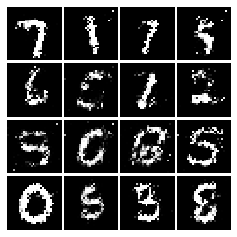

Epoch: 9, Iter: 4600, D: 0.2419, G:0.1505


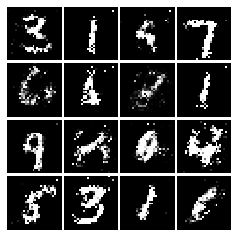

Epoch: 9, Iter: 4620, D: 0.2056, G:0.1781


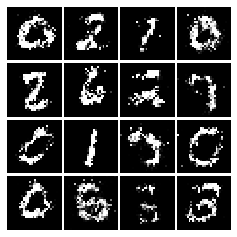

Epoch: 9, Iter: 4640, D: 0.2303, G:0.1557


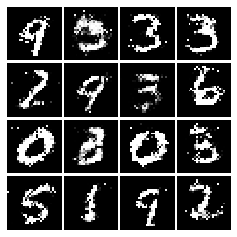

Epoch: 9, Iter: 4660, D: 0.2414, G:0.1681


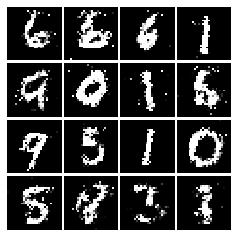

Epoch: 9, Iter: 4680, D: 0.2357, G:0.1408


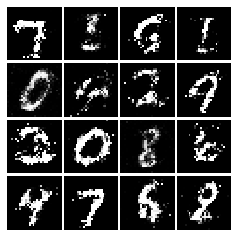

Final images


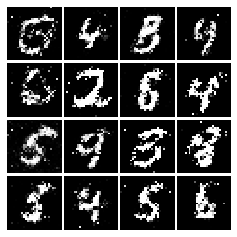

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [24]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model = tf.keras.models.Sequential([
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.367, G:0.6467


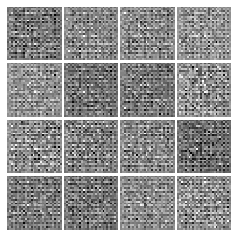

Epoch: 0, Iter: 20, D: 0.6156, G:0.9877


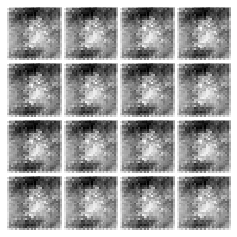

Epoch: 0, Iter: 40, D: 0.1527, G:2.283


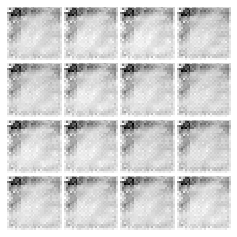

Epoch: 0, Iter: 60, D: 0.1417, G:4.011


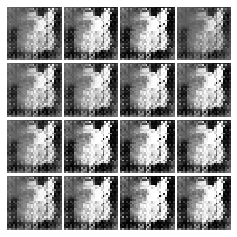

Epoch: 0, Iter: 80, D: 0.6237, G:2.122


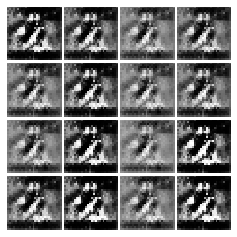

Epoch: 0, Iter: 100, D: 0.8118, G:2.388


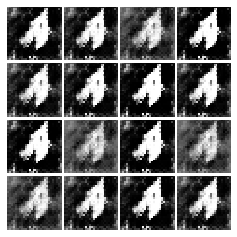

Epoch: 0, Iter: 120, D: 0.332, G:4.702


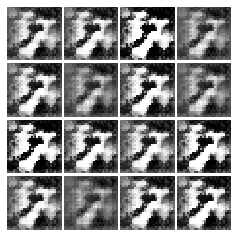

Epoch: 0, Iter: 140, D: 0.6829, G:2.522


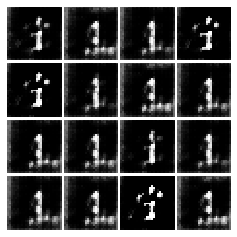

Epoch: 0, Iter: 160, D: 0.5119, G:2.295


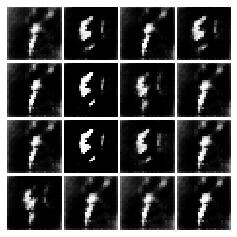

Epoch: 0, Iter: 180, D: 0.2637, G:2.83


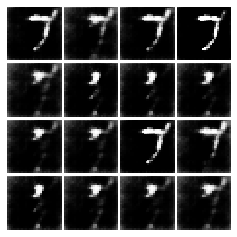

Epoch: 0, Iter: 200, D: 0.2891, G:2.701


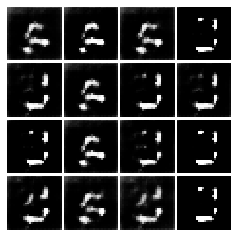

Epoch: 0, Iter: 220, D: 0.6974, G:1.922


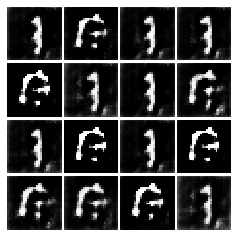

Epoch: 0, Iter: 240, D: 0.5797, G:2.405


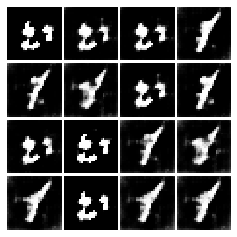

Epoch: 0, Iter: 260, D: 0.5027, G:2.361


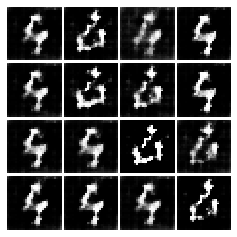

Epoch: 0, Iter: 280, D: 0.9208, G:1.759


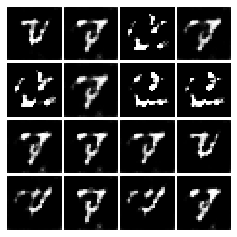

Epoch: 0, Iter: 300, D: 0.543, G:2.996


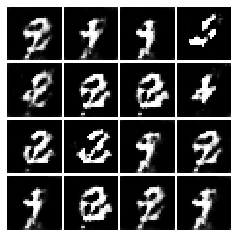

Epoch: 0, Iter: 320, D: 0.6171, G:1.994


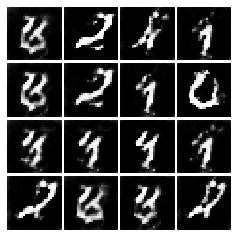

Epoch: 0, Iter: 340, D: 0.3748, G:2.719


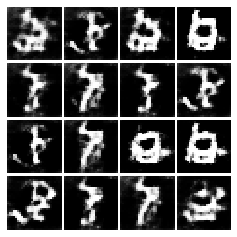

Epoch: 0, Iter: 360, D: 0.401, G:2.655


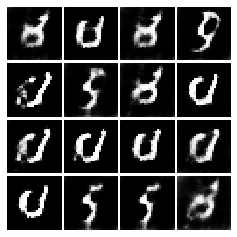

Epoch: 0, Iter: 380, D: 0.8075, G:2.558


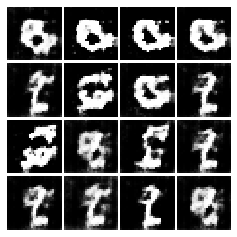

Epoch: 0, Iter: 400, D: 0.6492, G:1.773


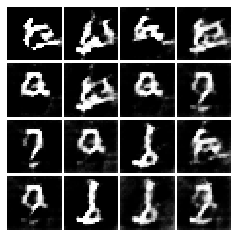

Epoch: 0, Iter: 420, D: 0.7057, G:4.666


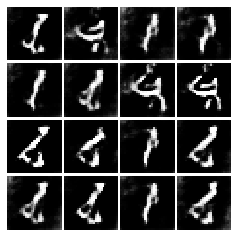

Epoch: 0, Iter: 440, D: 0.3794, G:2.172


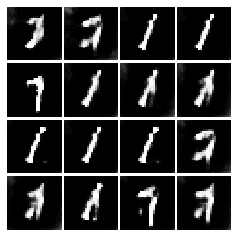

Epoch: 0, Iter: 460, D: 0.5714, G:2.155


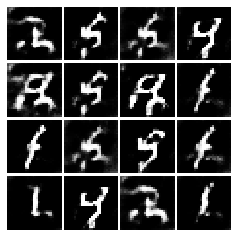

Epoch: 1, Iter: 480, D: 0.4342, G:1.723


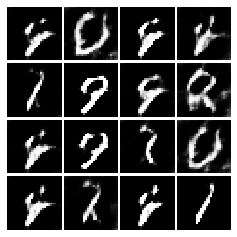

Epoch: 1, Iter: 500, D: 0.7967, G:4.546


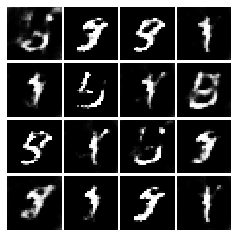

Epoch: 1, Iter: 520, D: 0.4913, G:2.616


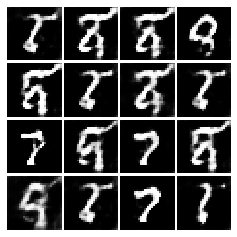

Epoch: 1, Iter: 540, D: 0.6733, G:2.147


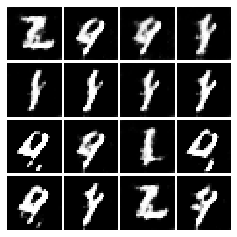

Epoch: 1, Iter: 560, D: 0.2999, G:2.759


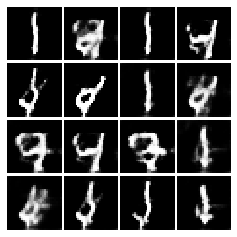

Epoch: 1, Iter: 580, D: 0.4672, G:2.435


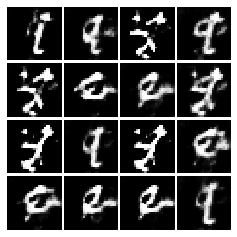

Epoch: 1, Iter: 600, D: 0.9517, G:4.296


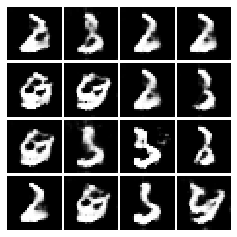

Epoch: 1, Iter: 620, D: 0.3696, G:3.469


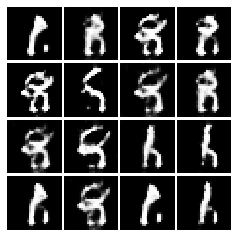

Epoch: 1, Iter: 640, D: 0.3467, G:3.291


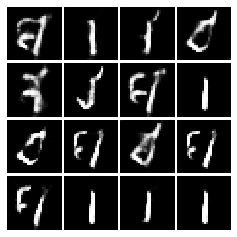

Epoch: 1, Iter: 660, D: 0.2821, G:2.844


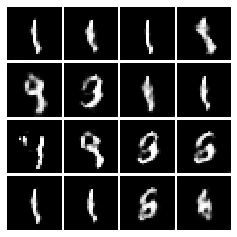

Epoch: 1, Iter: 680, D: 0.5729, G:2.405


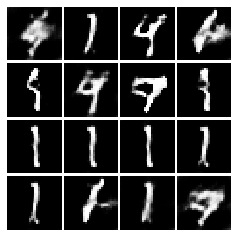

Epoch: 1, Iter: 700, D: 0.4622, G:2.839


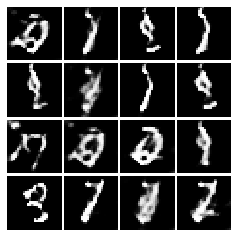

Epoch: 1, Iter: 720, D: 1.062, G:1.273


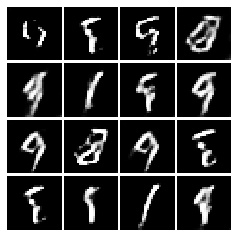

Epoch: 1, Iter: 740, D: 0.7949, G:1.986


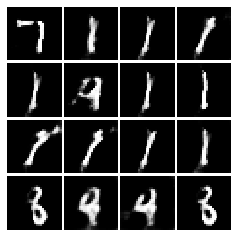

Epoch: 1, Iter: 760, D: 0.5356, G:2.64


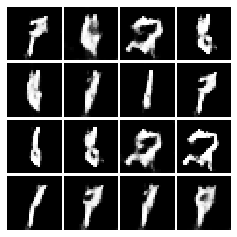

Epoch: 1, Iter: 780, D: 0.5917, G:1.745


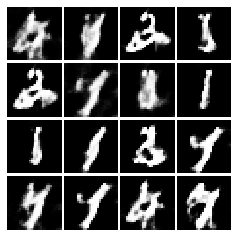

Epoch: 1, Iter: 800, D: 0.6763, G:2.203


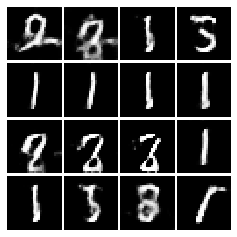

Epoch: 1, Iter: 820, D: 0.6079, G:1.998


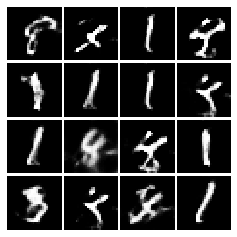

Epoch: 1, Iter: 840, D: 1.091, G:2.888


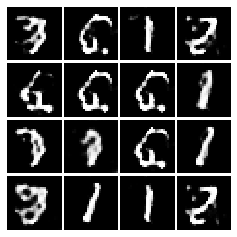

Epoch: 1, Iter: 860, D: 0.5954, G:1.967


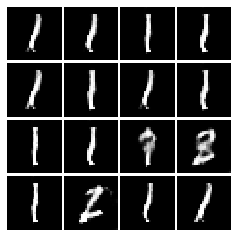

Epoch: 1, Iter: 880, D: 0.3552, G:2.457


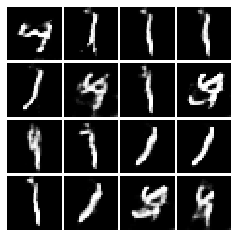

Epoch: 1, Iter: 900, D: 0.7278, G:3.535


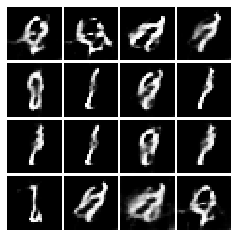

Epoch: 1, Iter: 920, D: 0.6758, G:3.489


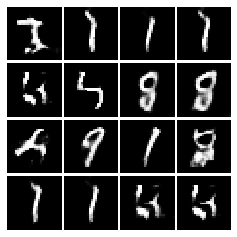

Epoch: 2, Iter: 940, D: 0.5621, G:2.596


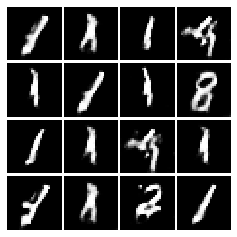

Epoch: 2, Iter: 960, D: 0.5073, G:2.154


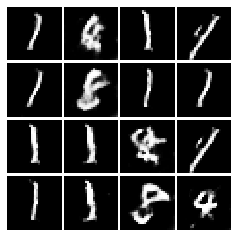

Epoch: 2, Iter: 980, D: 0.698, G:2.485


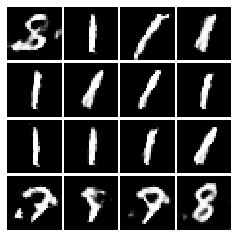

Epoch: 2, Iter: 1000, D: 0.7677, G:2.82


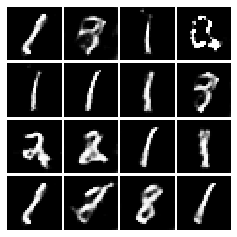

Epoch: 2, Iter: 1020, D: 0.5691, G:2.379


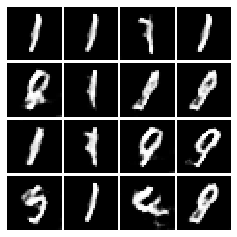

Epoch: 2, Iter: 1040, D: 0.5145, G:2.365


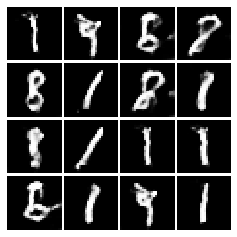

Epoch: 2, Iter: 1060, D: 0.4476, G:2.221


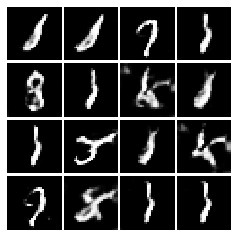

Epoch: 2, Iter: 1080, D: 0.5627, G:1.995


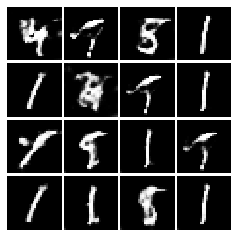

Epoch: 2, Iter: 1100, D: 0.7422, G:2.337


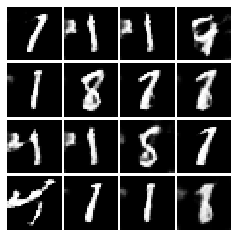

Epoch: 2, Iter: 1120, D: 0.7263, G:2.399


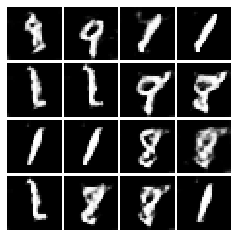

Epoch: 2, Iter: 1140, D: 0.582, G:2.373


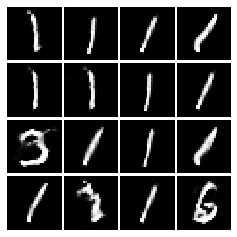

Epoch: 2, Iter: 1160, D: 0.5334, G:2.229


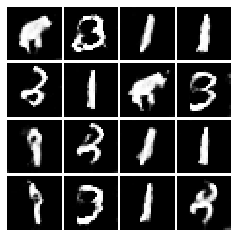

Epoch: 2, Iter: 1180, D: 0.5717, G:2.715


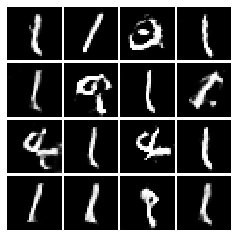

Epoch: 2, Iter: 1200, D: 0.5482, G:2.045


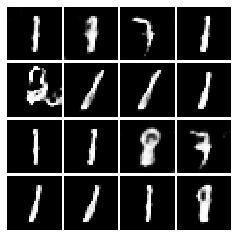

Epoch: 2, Iter: 1220, D: 0.491, G:1.861


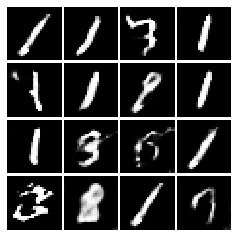

Epoch: 2, Iter: 1240, D: 0.5252, G:2.32


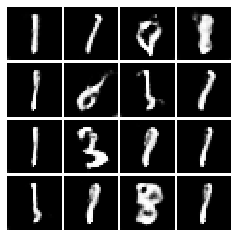

Epoch: 2, Iter: 1260, D: 0.5588, G:2.44


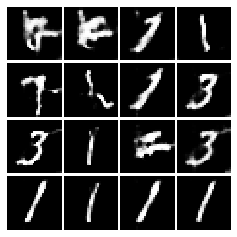

Epoch: 2, Iter: 1280, D: 0.5269, G:3.349


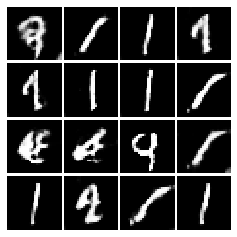

Epoch: 2, Iter: 1300, D: 0.51, G:2.113


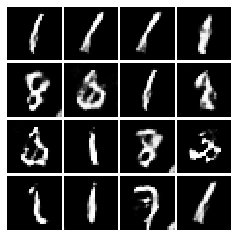

Epoch: 2, Iter: 1320, D: 0.6558, G:2.293


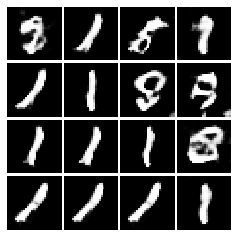

Epoch: 2, Iter: 1340, D: 0.4793, G:2.186


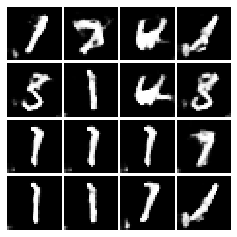

Epoch: 2, Iter: 1360, D: 0.4639, G:2.329


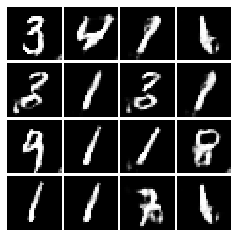

Epoch: 2, Iter: 1380, D: 0.5167, G:2.168


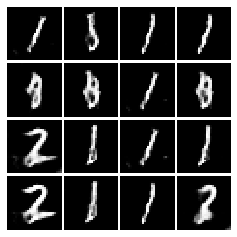

Epoch: 2, Iter: 1400, D: 0.4882, G:1.781


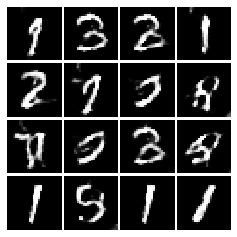

Epoch: 3, Iter: 1420, D: 0.5991, G:2.473


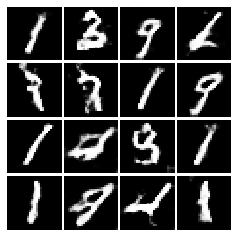

Epoch: 3, Iter: 1440, D: 0.5102, G:1.918


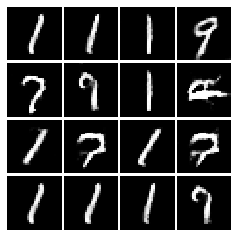

Epoch: 3, Iter: 1460, D: 0.6288, G:1.688


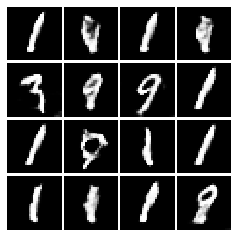

Epoch: 3, Iter: 1480, D: 0.3104, G:3.232


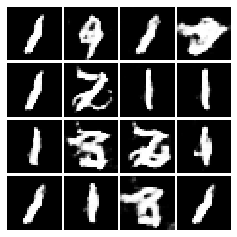

Epoch: 3, Iter: 1500, D: 0.48, G:2.258


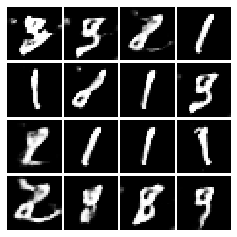

Epoch: 3, Iter: 1520, D: 0.5312, G:2.052


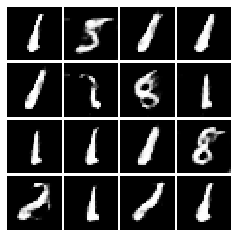

Epoch: 3, Iter: 1540, D: 0.6691, G:2.514


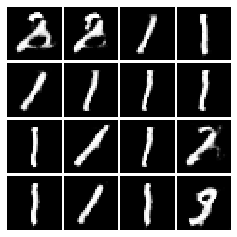

Epoch: 3, Iter: 1560, D: 0.4965, G:2.217


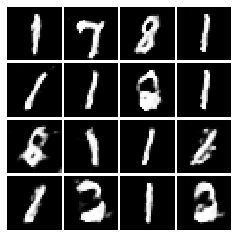

Epoch: 3, Iter: 1580, D: 0.412, G:1.676


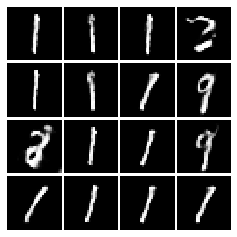

Epoch: 3, Iter: 1600, D: 0.5801, G:2.12


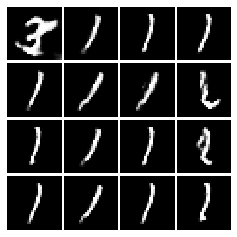

Epoch: 3, Iter: 1620, D: 0.5316, G:2.78


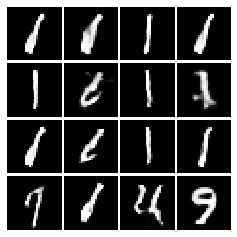

Epoch: 3, Iter: 1640, D: 0.3057, G:2.535


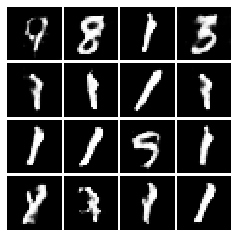

Epoch: 3, Iter: 1660, D: 0.4155, G:2.319


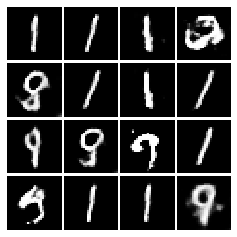

Epoch: 3, Iter: 1680, D: 0.4682, G:1.727


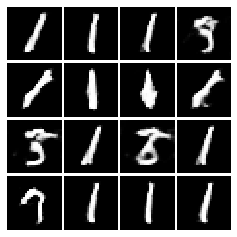

Epoch: 3, Iter: 1700, D: 0.4472, G:2.189


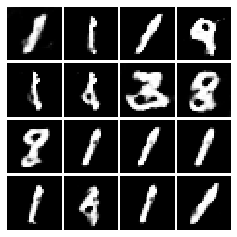

Epoch: 3, Iter: 1720, D: 0.4504, G:1.809


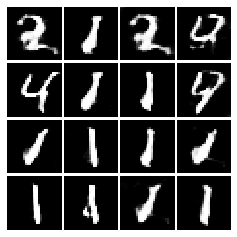

Epoch: 3, Iter: 1740, D: 0.5926, G:2.149


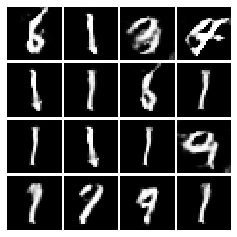

Epoch: 3, Iter: 1760, D: 0.5729, G:2.266


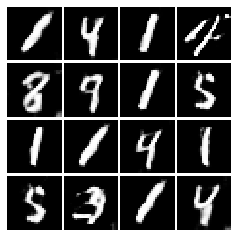

Epoch: 3, Iter: 1780, D: 0.5837, G:1.604


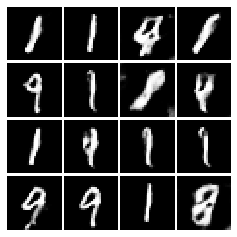

Epoch: 3, Iter: 1800, D: 0.5067, G:1.885


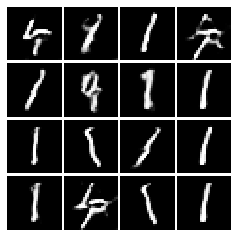

Epoch: 3, Iter: 1820, D: 0.6478, G:1.809


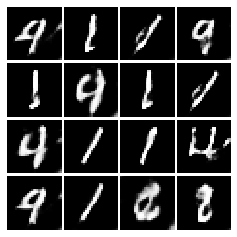

Epoch: 3, Iter: 1840, D: 0.6152, G:2.36


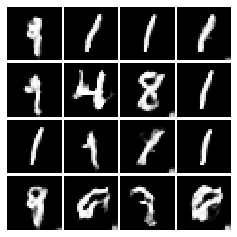

Epoch: 3, Iter: 1860, D: 0.491, G:1.553


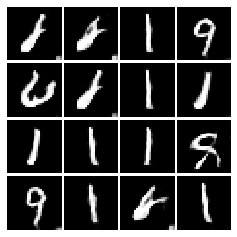

Epoch: 4, Iter: 1880, D: 0.4516, G:2.05


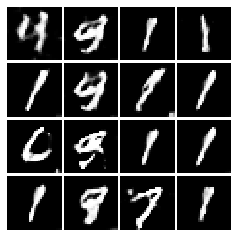

Epoch: 4, Iter: 1900, D: 0.4592, G:2.15


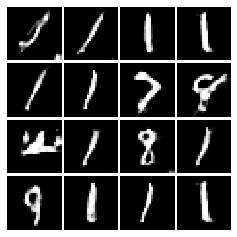

Epoch: 4, Iter: 1920, D: 0.5302, G:2.36


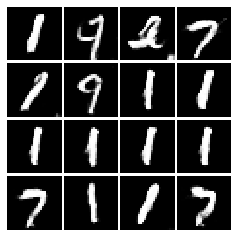

Epoch: 4, Iter: 1940, D: 0.439, G:1.999


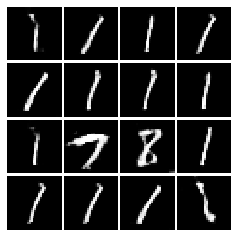

Epoch: 4, Iter: 1960, D: 0.6761, G:3.932


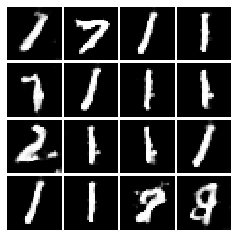

Epoch: 4, Iter: 1980, D: 0.4343, G:2.649


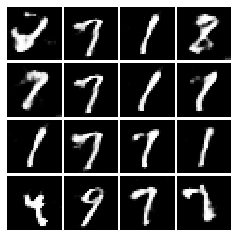

Epoch: 4, Iter: 2000, D: 0.7342, G:1.926


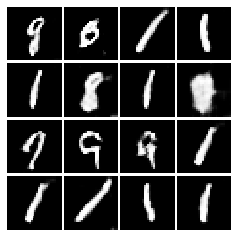

Epoch: 4, Iter: 2020, D: 0.5023, G:2.368


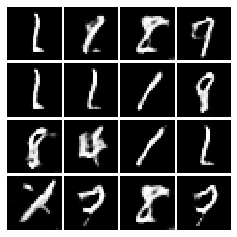

Epoch: 4, Iter: 2040, D: 0.4981, G:2.444


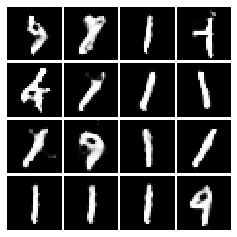

Epoch: 4, Iter: 2060, D: 0.304, G:2.631


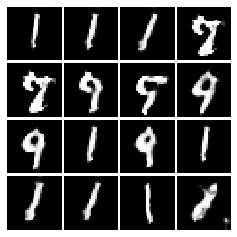

Epoch: 4, Iter: 2080, D: 0.5639, G:2.874


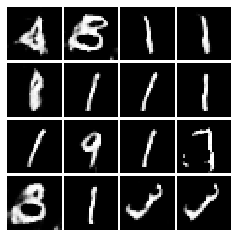

Epoch: 4, Iter: 2100, D: 0.5309, G:1.935


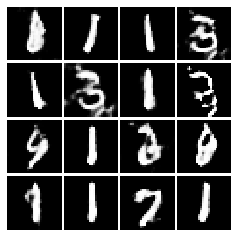

Epoch: 4, Iter: 2120, D: 0.6236, G:2.289


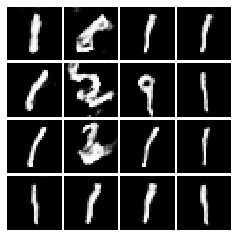

Epoch: 4, Iter: 2140, D: 0.7968, G:3.63


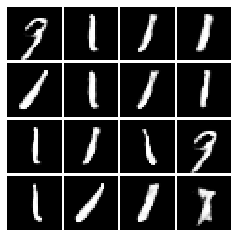

Epoch: 4, Iter: 2160, D: 0.5905, G:2.073


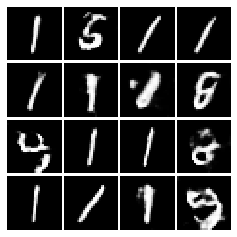

Epoch: 4, Iter: 2180, D: 0.6565, G:2.096


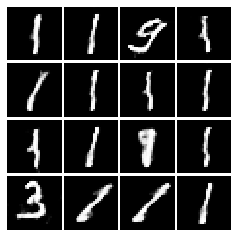

Epoch: 4, Iter: 2200, D: 0.5439, G:2.358


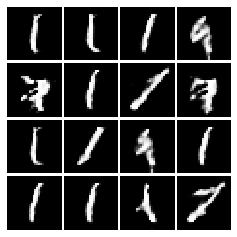

Epoch: 4, Iter: 2220, D: 0.4445, G:2.63


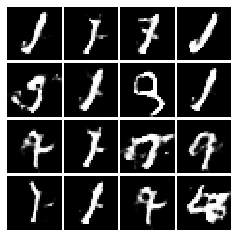

Epoch: 4, Iter: 2240, D: 0.3846, G:2.621


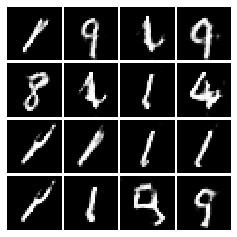

Epoch: 4, Iter: 2260, D: 0.394, G:2.424


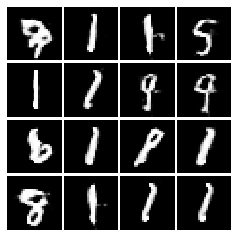

Epoch: 4, Iter: 2280, D: 0.5321, G:3.04


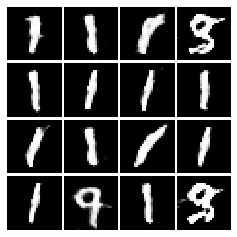

Epoch: 4, Iter: 2300, D: 0.5388, G:2.183


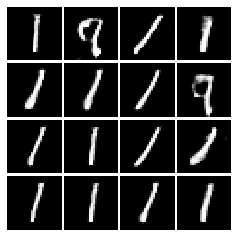

Epoch: 4, Iter: 2320, D: 0.4819, G:2.563


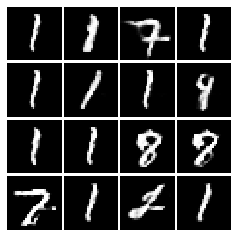

Epoch: 4, Iter: 2340, D: 0.5417, G:2.264


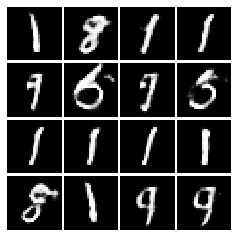

Final images


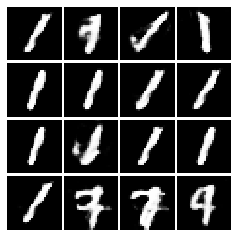

In [25]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1     
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 

최적의 값에 도달은 하지 않고 계속 순환하는 하는 형태로 값이 업데이트 된다 . 

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

올바르지 않은 신호로 discriminator은 noisy 데이터를 제대로 분류하지 못하도록 학습을 한다. 즉 generator가 생성한 이미지를 진짜 이미지로 간주하고 진짜 이미지는 noisy 이미지로 간주하여 모델의 성능이 안 좋아진다. 

## Reference 

- [jariasf github](https://github.com/jariasf/CS231n)
- [MahanFathi github](https://github.com/MahanFathi/CS231)
- [ubamba98 github](https://github.com/ubamba98/CS231n-2019)
- [Arnav0400 gitbub](https://github.com/Arnav0400/CS231n-2019)